In [1]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Ellipse

import pandas as pd
import numpy as np
import os
import xarray as xr

import astropy.units as au
import astropy.constants as ac

import sys

sys.path.insert(0, "../python/")

from fitting_scripts import (
    fit_odr,
    scifmt,
    labels,
    plot_fitting_mean,
    get_model_odr,
    add_panel_labels,
)  # noqa: E402

In [2]:
plt.style.use("ncr-paper.mplstyle")

In [3]:
outdir = "../lowZ-figures-paper"
os.makedirs(outdir, exist_ok=True)

/home/changgoo/.conda/envs/pyathena-lem/lib/python3.9/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)
/home/changgoo/.conda/envs/pyathena-lem/lib/python3.9/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: invalid value encountered in log10
  result = func(self.values, **kwargs)


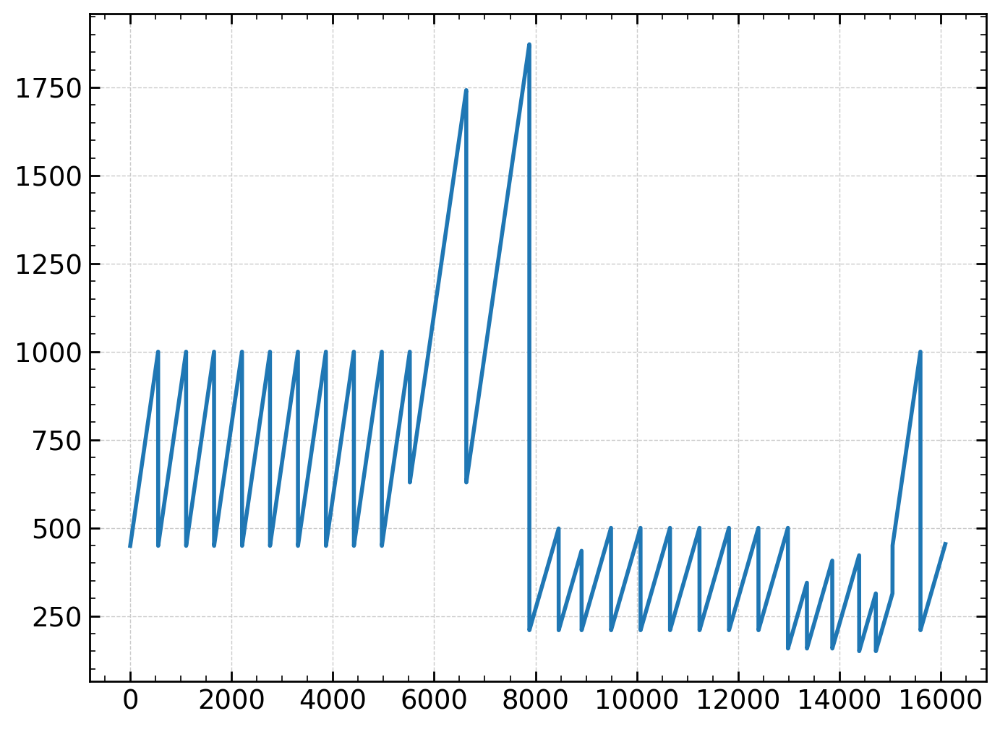

In [4]:
# "pt_df" is a pandas.DataFrame collecting relevant physical quantity time series from
# all simulations into a long-form array
# it will not be straightforward to bundle each model's points from this data
pt_df = pd.read_pickle("../data/points_all.p")
pt_logdf = np.log10(pt_df)

# one can bundle data for each model based on "time_code" field
# that is increasing within each model's data output
plt.plot(pt_df["time_code"])

In [5]:
# "qdset" is a xarray.Dataset storing the (16, 50, 84) percentile values and mean and std for each model's time series into an effectively 3D array.
with xr.open_dataarray("../data/percentiles_all.nc") as qdset:
    # get median values and convert it into pandas.DataFrame
    mid_df = qdset.sel(q="50").to_dataset(dim="variable").drop("q").to_dataframe()
    mid_logdf = np.log10(mid_df)

/home/changgoo/.conda/envs/pyathena-lem/lib/python3.9/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)
/home/changgoo/.conda/envs/pyathena-lem/lib/python3.9/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: invalid value encountered in log10
  result = func(self.values, **kwargs)


In [6]:
# these are all quantity name stored in this data
# we are mostly interested in fitting "Yxxx" as a function of "W" and "Zgas"
print("PDE_2p_avg_approx_sp2" in qdset["variable"])

True


In [7]:
qdset["name"]

<xarray.DataArray 'name' (name: 28)>
array(['R8_8pc_NCR_S30.full.b1.v3.iCR4.Zg1.Zd1.xy1024.eps0.0',
       'R8_8pc_NCR_S30.full.b1.v3.iCR4.Zg0.1.Zd0.1.xy2048.eps0.0',
       'R8_8pc_NCR.full.b10.v3.iCR4.Zg1.Zd1.xy2048.eps0.0',
       'R8_8pc_NCR.full.b10.v3.iCR4.Zg0.3.Zd0.3.xy4096.eps0.0',
       'R8_8pc_NCR.full.b10.v3.iCR4.Zg0.1.Zd0.1.xy4096.eps0.0',
       'R8_8pc_NCR.full.b10.v3.iCR4.Zg0.1.Zd0.025.xy4096.eps0.0',
       'R8_8pc_NCR.full.b1.v3.iCR4.Zg1.Zd1.xy2048.eps0.0',
       'R8_8pc_NCR.full.b1.v3.iCR4.Zg0.3.Zd0.3.xy4096.eps0.0',
       'R8_8pc_NCR.full.b1.v3.iCR4.Zg0.1.Zd0.1.xy4096.eps0.0',
       'R8_8pc_NCR.full.b1.v3.iCR4.Zg0.1.Zd0.025.xy4096.eps0.0',
       'LGR8_8pc_NCR_S05.full.b10.v3.iCR5.Zg1.Zd1.xy4096.eps0.0',
       'LGR8_8pc_NCR_S05.full.b10.v3.iCR5.Zg0.1.Zd0.1.xy8192.eps0.0',
       'LGR4_4pc_NCR_S100.full.b1.v3.iCR5.Zg1.Zd1.xy1024.eps1.e-8.rstZ01',
       'LGR4_4pc_NCR_S100.full.b1.v3.iCR4.Zg1.Zd1.xy1024.eps1.e-8',
       'LGR4_4pc_NCR_S100.full.b1.v3.iCR4.Zg0.1.Zd0.1.xy2048.eps1.e-8',
       'LGR4_4pc_NCR.full.b10.v3.iCR4.Zg1.Zd1.xy1024.eps1.e-8',
       'LGR4_4pc_NCR.full.b10.v3.iCR4.Zg0.1.Zd0.1.xy2048.eps1.e-8',
       'LGR4_4pc_NCR.full.b1.v3.iCR4.Zg1.Zd1.xy1024.eps1.e-8',
       'LGR4_4pc_NCR.full.b1.v3.iCR4.Zg0.3.Zd0.3.xy2048.eps1.e-8',
       'LGR4_4pc_NCR.full.b1.v3.iCR4.Zg0.1.Zd0.1.xy2048.eps1.e-8',
       'LGR4_4pc_NCR.full.b1.v3.iCR4.Zg0.1.Zd0.025.xy2048.eps1.e-8',
       'LGR2_4pc_NCR_S150.full.b2.Om02.v3.iCR5.Zg1.Zd1.xy1024.eps1.e-8.rstZ01',
       'LGR2_4pc_NCR_S150.full.b2.Om02.v3.iCR5.Zg1.Zd1.xy1024.eps1.e-8',
       'LGR2_4pc_NCR_S150.full.b2.Om02.v3.iCR5.Zg0.1.Zd0.1.xy2048.eps1.e-8',
       'LGR2_4pc_NCR_S150.full.b2.Om01.q0.v3.iCR5.Zg0.1.Zd0.1.xy2048.eps1.e-8',
       'LGR2_4pc_NCR_S150.full.b2.Om01.q0.v3.iCR5.Zg1.Zd1.xy1024.eps1.e-8',
       'R8_8pc_NCR.full.b1.v3.iCR4.Zg3.Zd3.xy1024.eps1.e-8',
       'LGR4_4pc_NCR.full.b1.v3.iCR4.Zg3.Zd3.xy1024.eps1.e-8'], dtype=object)
Coordinates:
  * name     (name) object 'R8_8pc_NCR_S30.full.b1.v3.iCR4.Zg1.Zd1.xy1024.eps...

In [8]:
# nsel=[]
# for n in qdset['name'].data:
#     if ('R8_8pc_NCR.full.b10' in n or
#         'LGR4_4pc_NCR.full.b10' in n or
#         'rstZ01' in n):
#         print(n)
#     else:
#         nsel.append(n)

In [9]:
# qdset = qdset.sel(name=nsel)

# fitting with mean and std

In [10]:
# We are fitting variables as a function of "W" and "Zgas"
# I set the parameter range of interest (in log scale) here
Zmin = -1.3
Zmax = 0.5
Wmin = 2.7
Wmax = 6.3

In [11]:
# setup figure output directory
# outdir = './lowZ-figures-nolegend/'
# outdir = './lowZ-figures-mean/'
# os.makedirs(outdir,exist_ok=True)
# outdir = '/tigress/changgoo/public_html/TIGRESS-NCR/lowZ-figures/'

In [12]:
# reference TIGRESS line property
Wref_min = 2.5
Wref_max = 6.5
Wref = np.linspace(Wref_min, Wref_max, 100)
ref_kwargs = dict(ls="--", color="k", lw=1)

Beta: [ 4.15077399  1.18959377 -0.01064926]
Beta Std Error: [0.02840493 0.02726835 0.03300271]
Beta Covariance: [[ 0.23790124 -0.13817115  0.15958926]
 [-0.13817115  0.21924371 -0.02582706]
 [ 0.15958926 -0.02582706  0.32115041]]
Residual Variance: 0.0033914903865305927
Inverse Condition #: 0.04956155889669388
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.14856727981279233
L2 : 0.1971932223146515


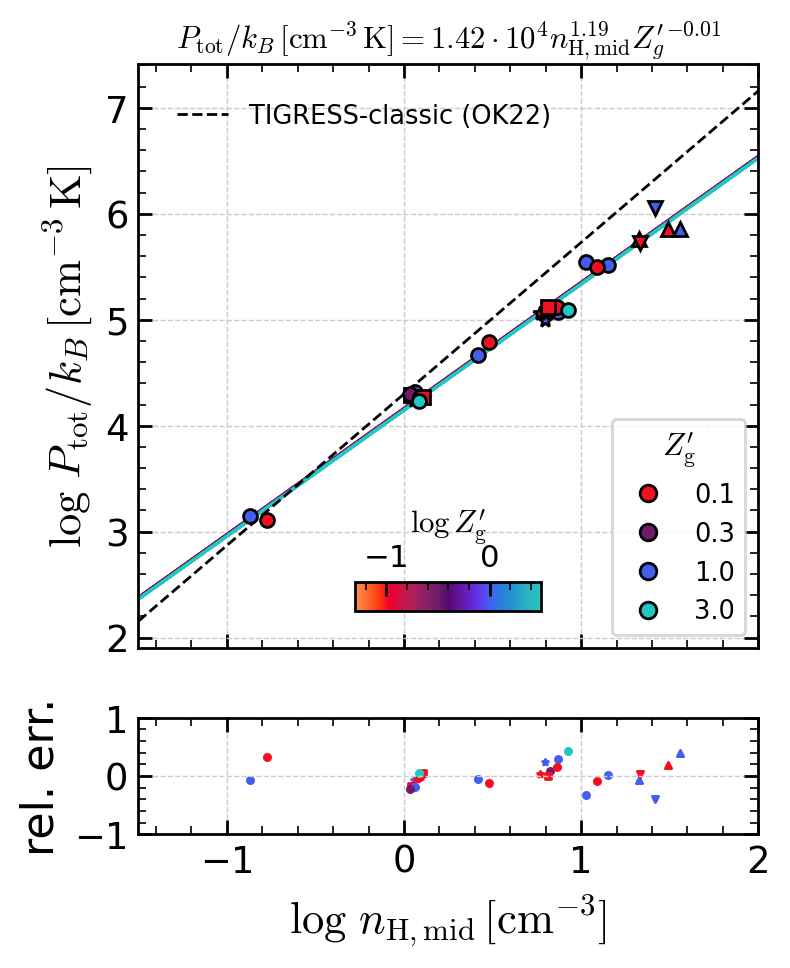

In [13]:
# Figure for the effective Equation of State (eEOS)
fig, axes = plt.subplots(
    2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
)

# set field names for x-axes and yaxis
# here we fit Ptot as a function of nH and Zgas
x1, x2, yf = ["nH", "Zgas", "Ptot"]

# linear regression
odr_out = fit_odr(qdset, xf1=x1, xf2=x2, yf=yf)
# construct model (not the x1-axis is not W and the parameter range is changed)
model_dset = get_model_odr(
    odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=-1.5, Wmax=2, dims=[x2, x1]
)

# plot simulation data along with fitting result
plt.sca(axes[0])
# write fitting result as the axis title
a = odr_out.beta[1]
b = odr_out.beta[2]
Y0 = 10 ** odr_out.beta[0]
tit = (
    labels[yf]
    + f"$={scifmt(Y0)} n_{{\\rm H,mid}}^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
)
plt.title(tit, fontsize="x-small")

# call plotting script
plot_fitting_mean(qdset, model_dset, x1, yf, legend=4, colorbar=8, model=True)
# plot all data as grey dots
# plt.plot(pt_df[x1],pt_df[yf],'.',color='grey',alpha=0.1,mew=0,zorder=-1)
plt.xlabel("")

# plot residual compared with the fitting result
plt.sca(axes[1])
plot_fitting_mean(qdset, model_dset, x1, yf, residual=True, model=True)

plt.xlim(-1.5, 2)
# add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
nH = model_dset.nH.data
plt.sca(axes[0])
plt.plot(nH, 4.3 + nH * 1.43, **ref_kwargs)
leg1 = plt.gca().get_legend()
custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
leg2 = plt.legend(
    custom_lines2,
    ["TIGRESS-classic (OK22)"],
    loc=2,
    borderpad=1,
    fontsize="xx-small",
    frameon=False,
)
plt.gca().add_artist(leg1)

# decorate axis
fig.axes[-1].xaxis.set_ticks_position("top")
fig.axes[-1].xaxis.set_label_position("top")
plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")

# save figure
plt.savefig(os.path.join(outdir, "eEOS_fit.png"), bbox_inches="tight")

Beta: [0.59686177 0.11746938 0.02958427]
Beta Std Error: [0.0508508  0.01031873 0.01427983]
Beta Covariance: [[ 1.70121508 -0.3387236   0.08922374]
 [-0.3387236   0.0700513  -0.00600083]
 [ 0.08922374 -0.00600083  0.13415591]]
Residual Variance: 0.0015199746063738956
Inverse Condition #: 0.0033136811889109296
Reason(s) for Halting:
  Sum of squares convergence


L1 : 0.0668125380190833
L2 : 0.08407694060022179
Beta: [ 0.59977039  0.08837773 -0.00196281]
Beta Std Error: [0.06526977 0.01324461 0.01832931]
Beta Covariance: [[ 1.68972742 -0.33643512  0.08863399]
 [-0.33643512  0.0695778  -0.00596251]
 [ 0.08863399 -0.00596251  0.13325529]]
Residual Variance: 0.0025212015239891865
Inverse Condition #: 0.003313653704004193
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.07536545237597382
L2 : 0.10519383645524158
Beta: [0.38683339 0.11934717 0.07551983]
Beta Std Error: [0.17987571 0.03650249 0.05051294]
Beta Covariance: [[ 1.71052467 -0.34059494  0.08954652]
 [-0.34059494  0.07044162 -0.00599891]
 [ 0.08954652 -0.00599891  0.13489305]]
Residual Variance: 0.01891540670240671
Inverse Condition #: 0.003313572975973319
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.21450522996212257
L2 : 0.3430342360965945
Beta: [0.18629559 0.13054115 0.1061368 ]
Beta Std Error: [0.17262607 0.03503185 0.04848363]
Beta Covariance: [[ 1.72452307 -0.3

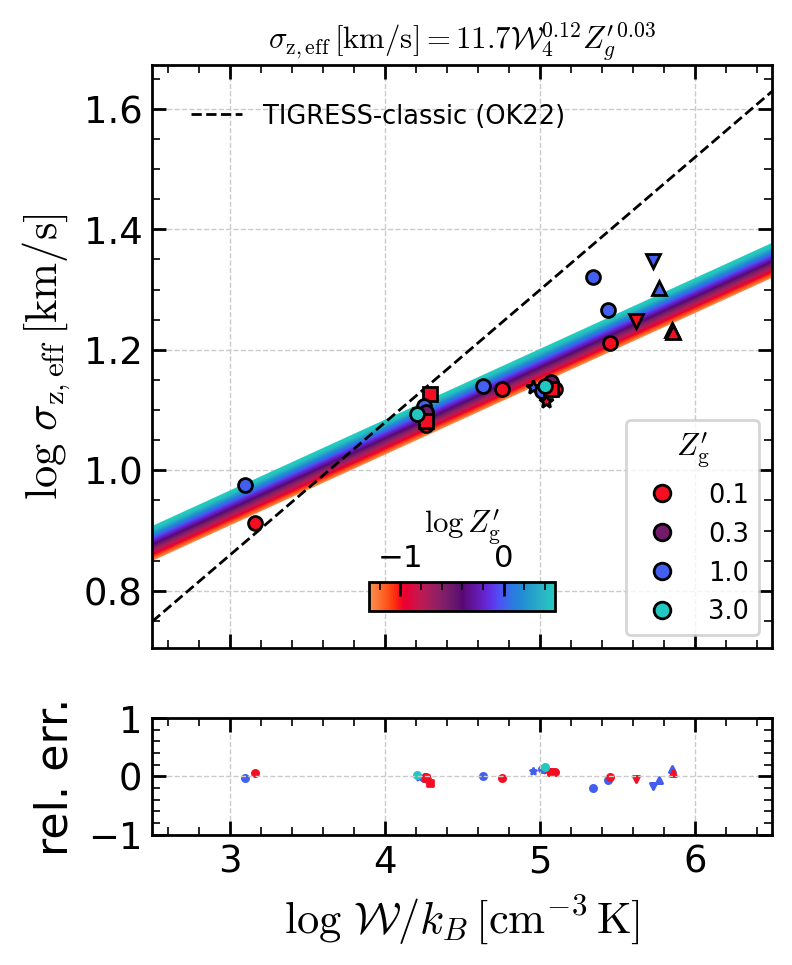

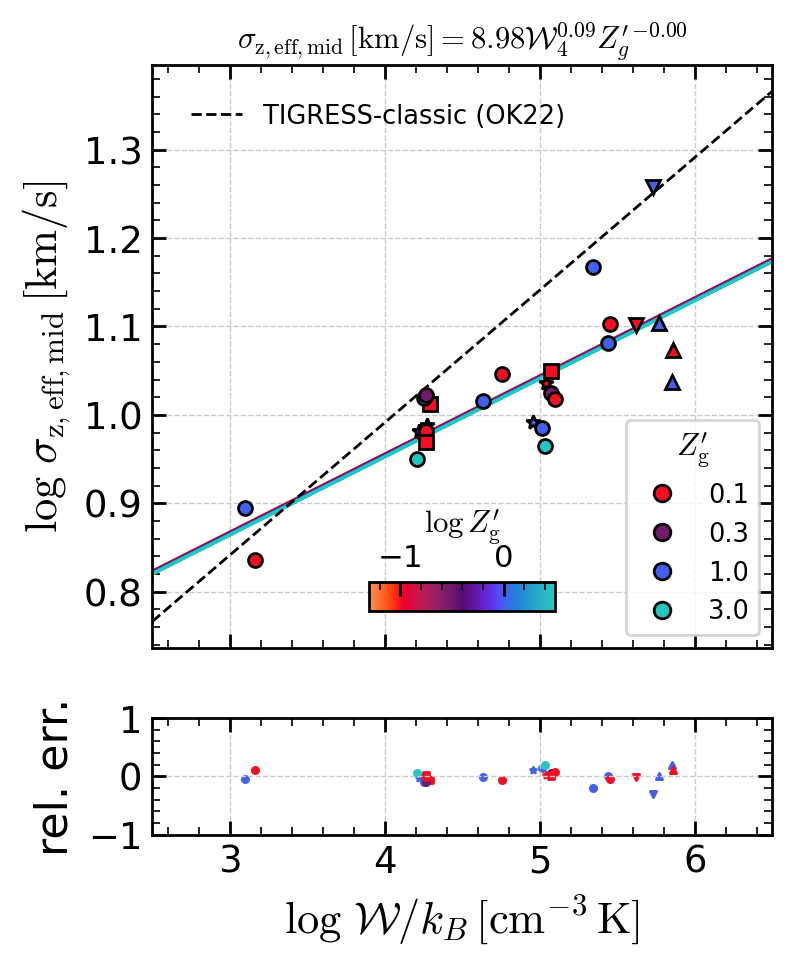

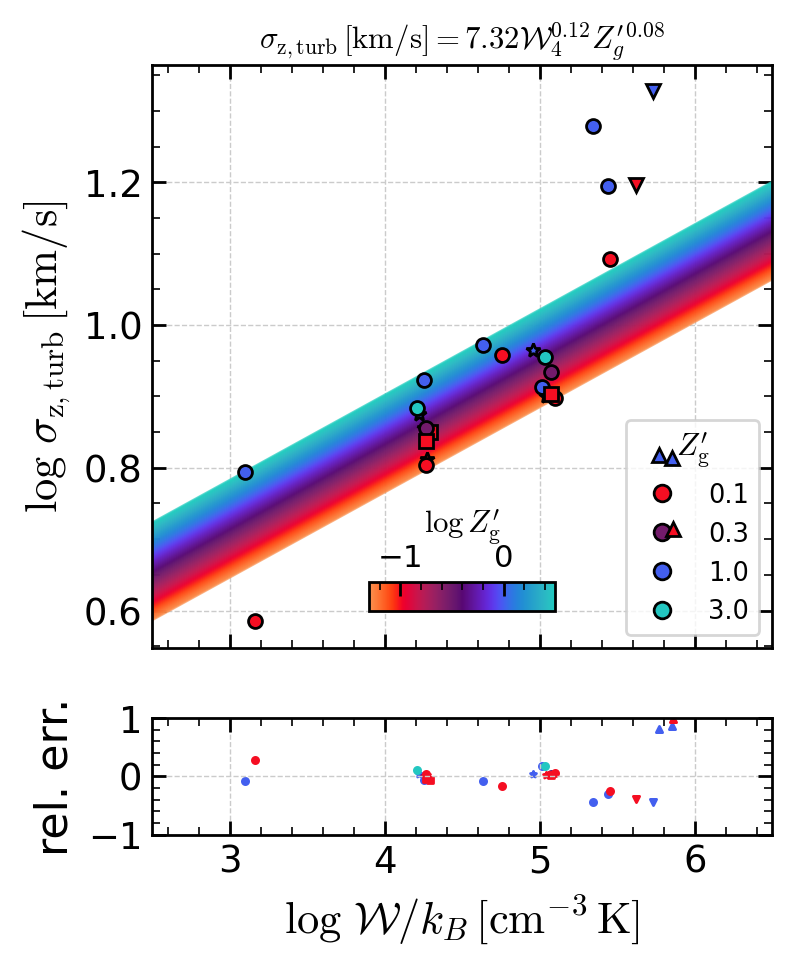

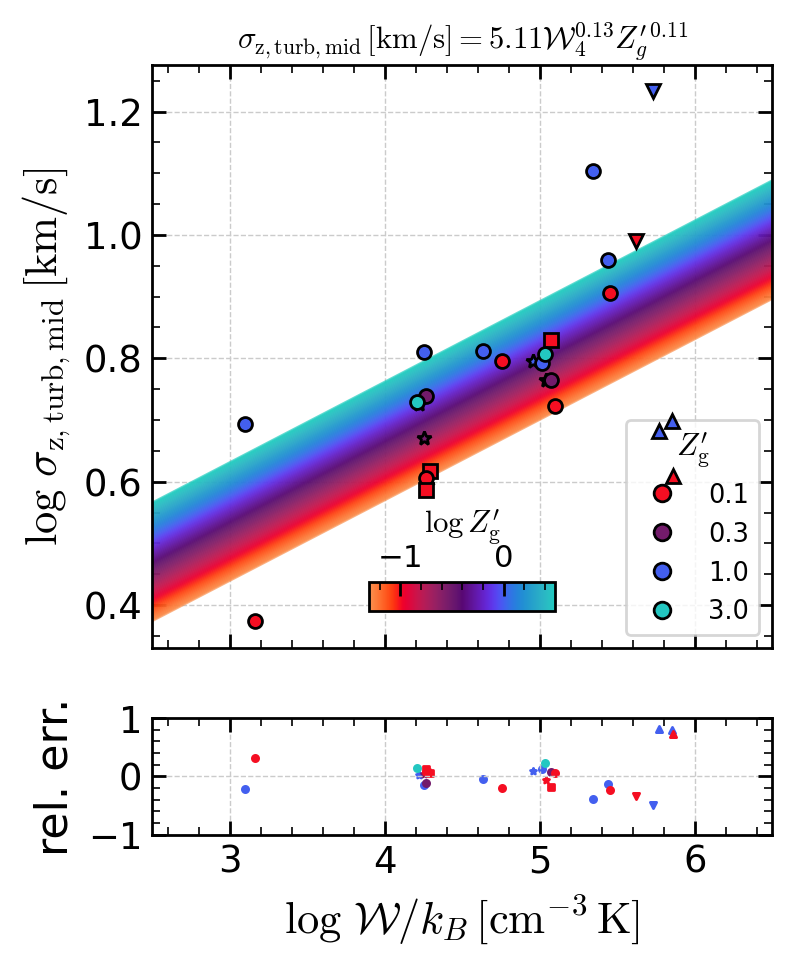

In [14]:
# Figure for the velocity dispersions
for yf in ["sigma_eff", "sigma_eff_mid", "sigma_turb", "sigma_turb_mid"]:
    fig, axes = plt.subplots(
        2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
    )

    # set field names for x-axes and yaxis
    # here we fit Ptot as a function of nH and Zgas
    x1, x2 = ["W", "Zgas"]

    # linear regression
    odr_out = fit_odr(qdset, xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset = get_model_odr(odr_out, Zmin=Zmin, Zmax=Zmax, dims=[x2, x1])

    # plot simulation data along with fitting result
    plt.sca(axes[0])
    # write fitting result as the axis title
    a = odr_out.beta[1]
    b = odr_out.beta[2]
    Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
    tit = (
        labels[yf]
        + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
    )
    plt.title(tit, fontsize="x-small")

    # call plotting script
    plot_fitting_mean(qdset, model_dset, x1, yf, legend=4, colorbar=8, model=True)
    # plot all data as grey dots
    # plt.plot(pt_df[x1],pt_df[yf],'.',color='grey',alpha=0.1,mew=0,zorder=-1)
    plt.xlabel("")

    # plot residual compared with the fitting result
    plt.sca(axes[1])
    plot_fitting_mean(qdset, model_dset, x1, yf, residual=True, model=True)

    # add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
    plt.sca(axes[0])
    plt.xlim(Wref_min, Wref_max)
    # plt.plot(W,np.log10(9.05)+0.08*(W-4),ls='--',color='r',lw=1)
    if "turb" not in yf:
        if "mid" in yf:
            plt.plot(Wref, np.log10(9.8) + 0.15 * (Wref - 4), **ref_kwargs)
        else:
            plt.plot(Wref, np.log10(12) + 0.22 * (Wref - 4), **ref_kwargs)
        leg1 = plt.gca().get_legend()
        custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
        leg2 = plt.legend(
            custom_lines2,
            ["TIGRESS-classic (OK22)"],
            loc=2,
            borderpad=1,
            fontsize="xx-small",
            frameon=False,
        )
        plt.gca().add_artist(leg1)

    # decorate axis
    fig.axes[-1].xaxis.set_ticks_position("top")
    fig.axes[-1].xaxis.set_label_position("top")
    plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
    fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")

    # save figure
    plt.savefig(os.path.join(outdir, f"{yf}_fit.png"), bbox_inches="tight")

In [15]:
# Figure for the velocity dispersions
yf = "sigma_turb"
fig, axes = plt.subplots(
    2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
)

# set field names for x-axes and yaxis
# here we fit Ptot as a function of nH and Zgas
x1, x2 = ["W", "Zgas"]

# linear regression
odr_out = fit_odr(qdset, xf1=x1, xf2=x2, yf=yf)
# construct model (not the x1-axis is not W and the parameter range is changed)
model_dset = get_model_odr(odr_out, Zmin=Zmin, Zmax=Zmax, dims=[x2, x1])

# plot simulation data along with fitting result
plt.sca(axes[0])
# write fitting result as the axis title
a = odr_out.beta[1]
b = odr_out.beta[2]
Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
tit = (
    labels[yf]
    + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
)
plt.title(tit, fontsize="x-small")

# call plotting script
plot_fitting_mean(qdset, model_dset, x1, yf, legend=0, colorbar=0, model=True)
plt.xlabel("")

# plot residual compared with the fitting result
plt.sca(axes[1])
plot_fitting_mean(qdset, model_dset, x1, yf, residual=True, model=True)

# add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
W = model_dset.W.data
plt.sca(axes[0])

# two labels
el = Ellipse((5.67, 1.26), 0.35, 0.175, ls="--", fc="none", color="k", lw=1)
axes[0].add_artist(el)
plt.annotate(
    "S150-Om100q0", (5.6, 1.255), family="monospace", fontsize=8, ha="left", va="center"
)

el = Ellipse((5.85, 0.76), 0.3, 0.2, ls="--", fc="none", color="k", lw=1, zorder=20)
axes[0].add_artist(el)
plt.annotate(
    "S150-Om200", (5.9, 0.65), family="monospace", fontsize=8, ha="center", va="top"
)
plt.xlim(Wref_min, Wref_max)
# save figure
plt.savefig(os.path.join(outdir, f"{yf}_fit_nolegend.png"), bbox_inches="tight")

Beta: [0.38683339 0.11934717 0.07551983]
Beta Std Error: [0.17987571 0.03650249 0.05051294]
Beta Covariance: [[ 1.71052467 -0.34059494  0.08954652]
 [-0.34059494  0.07044162 -0.00599891]
 [ 0.08954652 -0.00599891  0.13489305]]
Residual Variance: 0.01891540670240671
Inverse Condition #: 0.003313572975973319
Reason(s) for Halting:
  Sum of squares convergence


Beta: [-0.10158242  1.03647142  0.05385291]
Beta Std Error: [0.08794087 0.01751203 0.02745631]
Beta Covariance: [[ 3.75937301 -0.73063401  0.31605986]
 [-0.73063401  0.14907566 -0.0259482 ]
 [ 0.31605986 -0.0259482   0.36645293]]
Residual Variance: 0.002057150448995789
Inverse Condition #: 0.0032198849051120384
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.14068531068989745
L2 : 0.26567664628139515
Beta: [-0.03296739  0.99720348  0.00944245]
Beta Std Error: [0.07679376 0.01529204 0.02397988]
Beta Covariance: [[ 3.60855221 -0.7013059   0.30352475]
 [-0.7013059   0.14309094 -0.02492413]
 [ 0.30352475 -0.02492413  0.35186414]]
Residual Variance: 0.0016342513801973558
Inverse Condition #: 0.0032203687894681917
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.12892590851699676
L2 : 0.15235155971145461
Beta: [ 0.35201934  0.91736117 -0.05201662]
Beta Std Error: [0.05599656 0.01115025 0.01749089]
Beta Covariance: [[ 3.33487964 -0.6480861   0.2807236 ]
 [-0.6480861   0.1

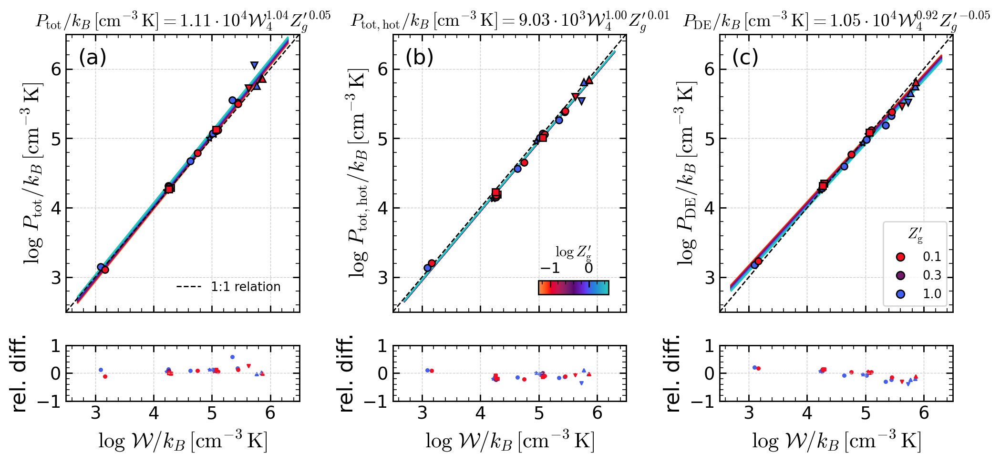

In [ ]:
# Figure for
# (a) vertical dynamical equilibrium (Ptot vs W)
# (b) pressure equilibrium between phases (Ptot_hot vs W)
# (c) comparison with analytic weight estimator (PDE from Equation 7 in Ostriker & Kim 2022 vs W)
fig, axes_ = plt.subplots(
    2,
    3,
    sharex="col",
    figsize=(12, 5),
    gridspec_kw=dict(height_ratios=[1, 0.2], wspace=0.4, hspace=0.2),
)

# set field names for x-axes
x1, x2 = ["W", "Zgas"]
for yf, axes in zip(["Ptot", "Ptot_hot", "PDE_2p_avg_approx"], axes_.T):
    # linear regression
    odr_out = fit_odr(qdset, xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # plot simulation data along with fitting result
    plt.sca(axes[0])

    # write fitting result as the axis title
    a = odr_out.beta[1]
    b = odr_out.beta[2]
    Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
    l = labels[yf] if yf in labels else labels["PDE"]
    tit = (
        l + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
    )
    plt.title(tit, fontsize="small")

    # call plotting script
    sm = plot_fitting_mean(
        qdset,
        model_dset,
        x1,
        yf,
        legend=4 if yf.startswith("PDE") else 0,
        colorbar=4 if yf.startswith("Ptot_hot") else 0,
        model=True,
    )
    # plot one-to-one line
    plt.plot([Wref_min, Wref_max], [Wref_min, Wref_max], **ref_kwargs)
    plt.xlim(Wref_min, Wref_max)
    plt.ylim(Wref_min, Wref_max)
    # plot all data points as grey dots
    # plt.plot(pt_df[x1],pt_df[yf],'.',color='grey',alpha=0.1,mew=0,zorder=-1)
    plt.xlabel("")
    # plt.ylim(3.e2,3.e6)

    # plot residual by comparing x and y field (not comparing with model; model = False)
    plt.sca(axes[1])
    plot_fitting_mean(qdset, model_dset, x1, yf, residual=True, model=False)

# decorate figure
fig.axes[-1].xaxis.set_ticks_position("top")
fig.axes[-1].xaxis.set_label_position("top")
plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")

# add custom legend
plt.sca(axes_[0, 0])
custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
leg2 = plt.legend(
    custom_lines2,
    ["1:1 relation"],
    loc=4,
    borderpad=1,
    fontsize="xx-small",
    frameon=False,
)

# add panel label (a), (b), ...
add_panel_labels(axes_[0, :])

# save figure
plt.savefig(os.path.join(outdir, "PW_fit.png"), bbox_inches="tight")

Beta: [-0.10158242  1.03647142  0.05385291]
Beta Std Error: [0.08794087 0.01751203 0.02745631]
Beta Covariance: [[ 3.75937301 -0.73063401  0.31605986]
 [-0.73063401  0.14907566 -0.0259482 ]
 [ 0.31605986 -0.0259482   0.36645293]]
Residual Variance: 0.002057150448995789
Inverse Condition #: 0.0032198849051120384
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.14068531068989745
L2 : 0.26567664628139515
Beta: [-0.03296739  0.99720348  0.00944245]
Beta Std Error: [0.07679376 0.01529204 0.02397988]
Beta Covariance: [[ 3.60855221 -0.7013059   0.30352475]
 [-0.7013059   0.14309094 -0.02492413]
 [ 0.30352475 -0.02492413  0.35186414]]
Residual Variance: 0.0016342513801973558
Inverse Condition #: 0.0032203687894681917
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.12892590851699676
L2 : 0.15235155971145461
Beta: [ 0.26128429  0.94515419 -0.03040737]
Beta Std Error: [0.03128949 0.00623044 0.00977559]
Beta Covariance: [[ 3.42374129 -0.66534288  0.28823443]
 [-0.66534288  0.1

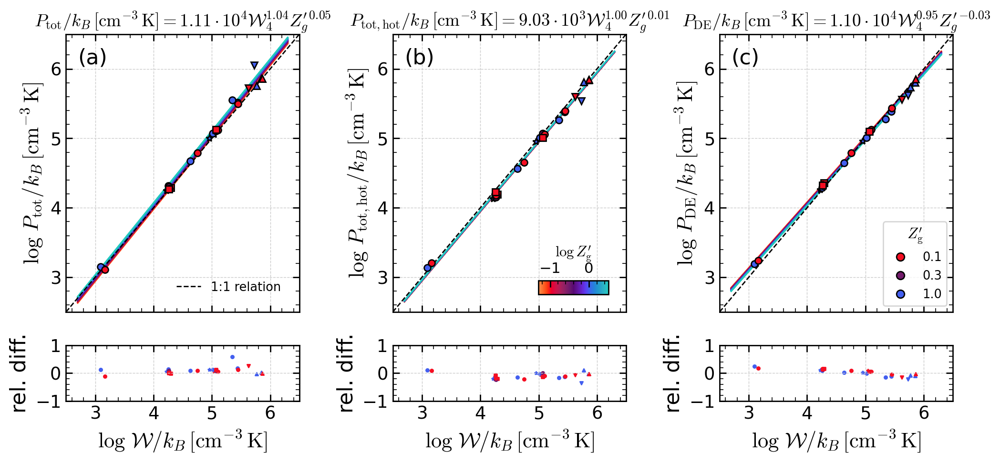

In [ ]:
# Figure for
# (a) vertical dynamical equilibrium (Ptot vs W)
# (b) pressure equilibrium between phases (Ptot_hot vs W)
# (c) comparison with analytic weight estimator (PDE from Equation 7 in Ostriker & Kim 2022 vs W)
fig, axes_ = plt.subplots(
    2,
    3,
    sharex="col",
    figsize=(12, 5),
    gridspec_kw=dict(height_ratios=[1, 0.2], wspace=0.4, hspace=0.2),
)

# set field names for x-axes
x1, x2 = ["W", "Zgas"]
for yf, axes in zip(["Ptot", "Ptot_hot", "PDE_2p_avg_approx_sp"], axes_.T):
    # linear regression
    odr_out = fit_odr(qdset, xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # plot simulation data along with fitting result
    plt.sca(axes[0])

    # write fitting result as the axis title
    a = odr_out.beta[1]
    b = odr_out.beta[2]
    Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
    l = labels[yf] if yf in labels else labels["PDE"]
    tit = (
        l + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
    )
    plt.title(tit, fontsize="small")

    # call plotting script
    sm = plot_fitting_mean(
        qdset,
        model_dset,
        x1,
        yf,
        legend=4 if yf.startswith("PDE") else 0,
        colorbar=4 if yf.startswith("Ptot_hot") else 0,
        model=True,
    )
    # plot one-to-one line
    plt.plot([Wref_min, Wref_max], [Wref_min, Wref_max], **ref_kwargs)
    plt.xlim(Wref_min, Wref_max)
    plt.ylim(Wref_min, Wref_max)
    # plot all data points as grey dots
    # plt.plot(pt_df[x1],pt_df[yf],'.',color='grey',alpha=0.1,mew=0,zorder=-1)
    plt.xlabel("")
    # plt.ylim(3.e2,3.e6)

    # plot residual by comparing x and y field (not comparing with model; model = False)
    plt.sca(axes[1])
    plot_fitting_mean(qdset, model_dset, x1, yf, residual=True, model=False)

# decorate figure
fig.axes[-1].xaxis.set_ticks_position("top")
fig.axes[-1].xaxis.set_label_position("top")
plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")

# add custom legend
plt.sca(axes_[0, 0])
custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
leg2 = plt.legend(
    custom_lines2,
    ["1:1 relation"],
    loc=4,
    borderpad=1,
    fontsize="xx-small",
    frameon=False,
)

# add panel label (a), (b), ...
add_panel_labels(axes_[0, :])

# save figure
plt.savefig(os.path.join(outdir, "PW_fit_sp.png"), bbox_inches="tight")

Beta: [ 4.76023829 -0.35194862 -0.32422183]
Beta Std Error: [0.23024856 0.04588067 0.07214993]
Beta Covariance: [[ 2.22381057 -0.43243225  0.18479743]
 [-0.43243225  0.08830056 -0.01472713]
 [ 0.18479743 -0.01472713  0.21836132]]
Residual Variance: 0.023839441040998246
Inverse Condition #: 0.003224528195351696
Reason(s) for Halting:
  Sum of squares convergence
Ytot
L1 : 0.3218881122803398
L2 : 0.41845627209769876
Beta: [ 4.77950412 -0.52648525 -0.59328964]
Beta Std Error: [0.15702443 0.03128173 0.04920877]
Beta Covariance: [[ 2.94562411 -0.57264484  0.24605037]
 [-0.57264484  0.11690266 -0.01976627]
 [ 0.24605037 -0.01976627  0.28928627]]
Residual Variance: 0.008370610588845582
Inverse Condition #: 0.0032243212459416837
Reason(s) for Halting:
  Sum of squares convergence
Yth
L1 : 0.2075668518188497
L2 : 0.29064205724595193
Beta: [ 4.0124702  -0.27816591 -0.07078255]
Beta Std Error: [0.2684712  0.05347704 0.08376483]
Beta Covariance: [[ 1.96225362 -0.38148541  0.16400273]
 [-0.38148541

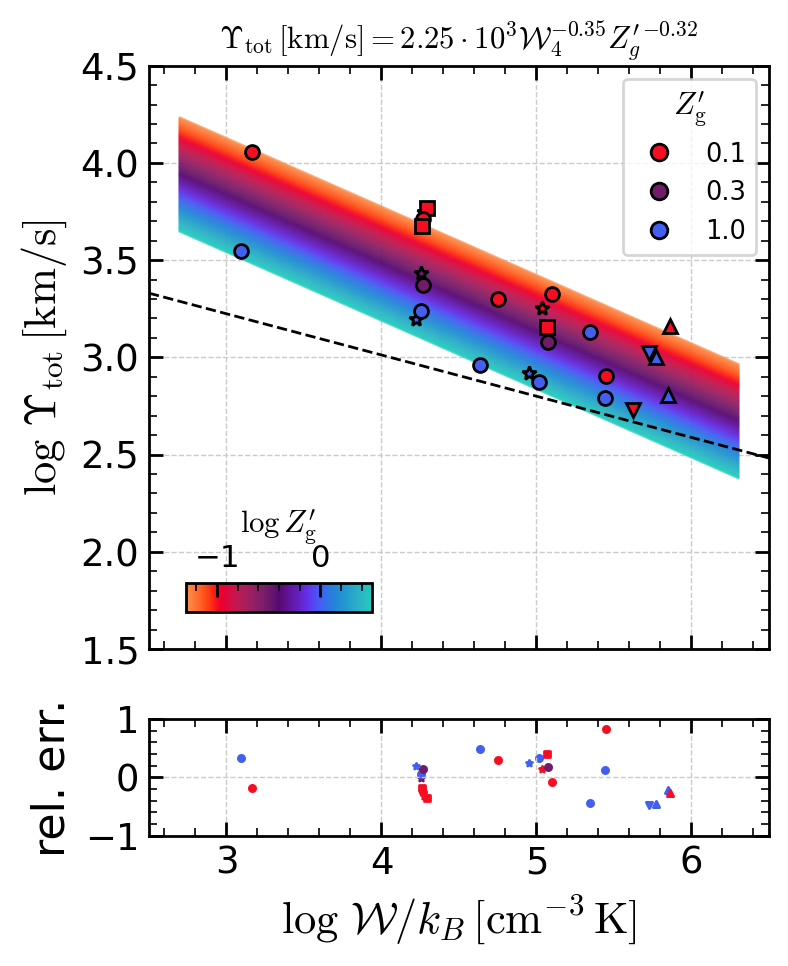

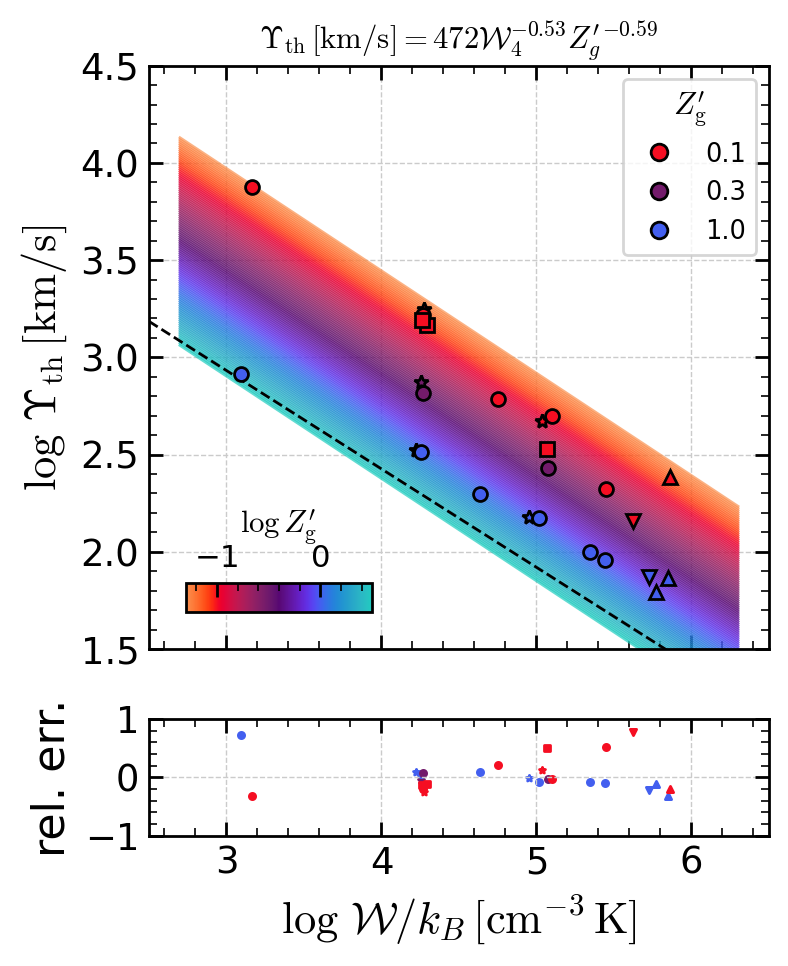

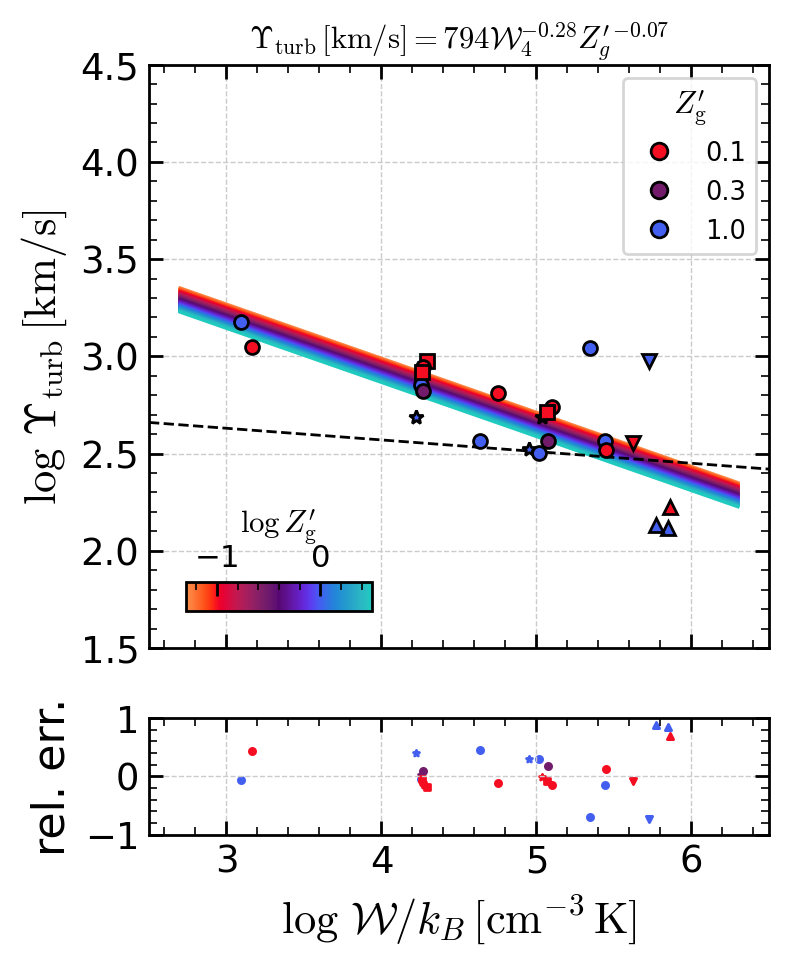

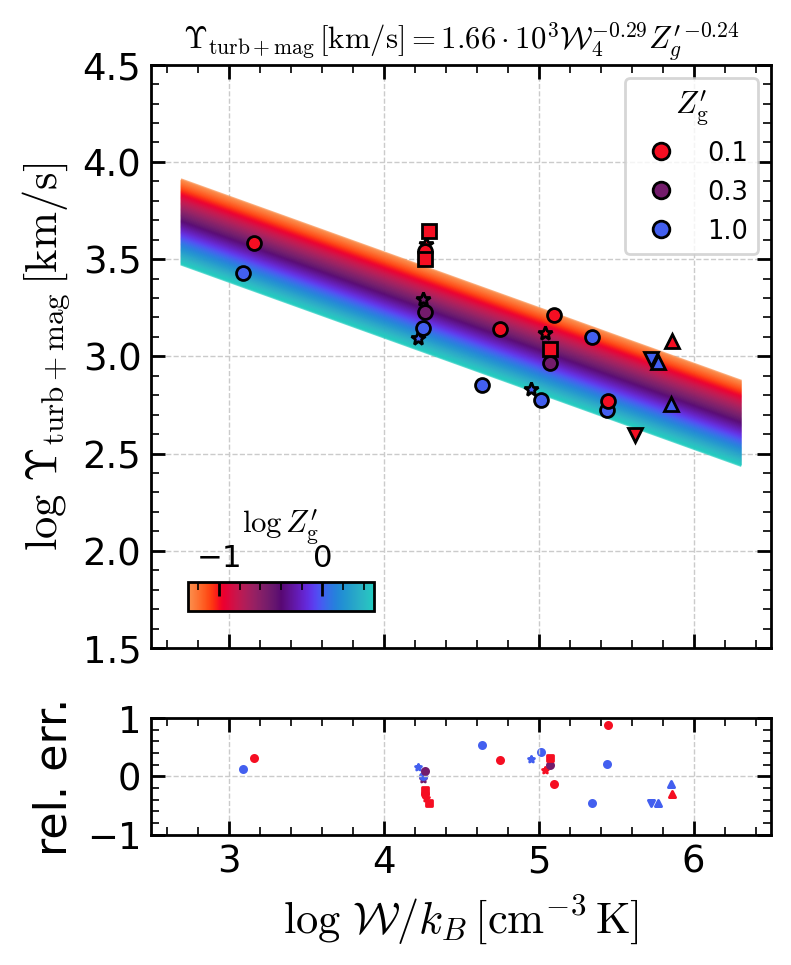

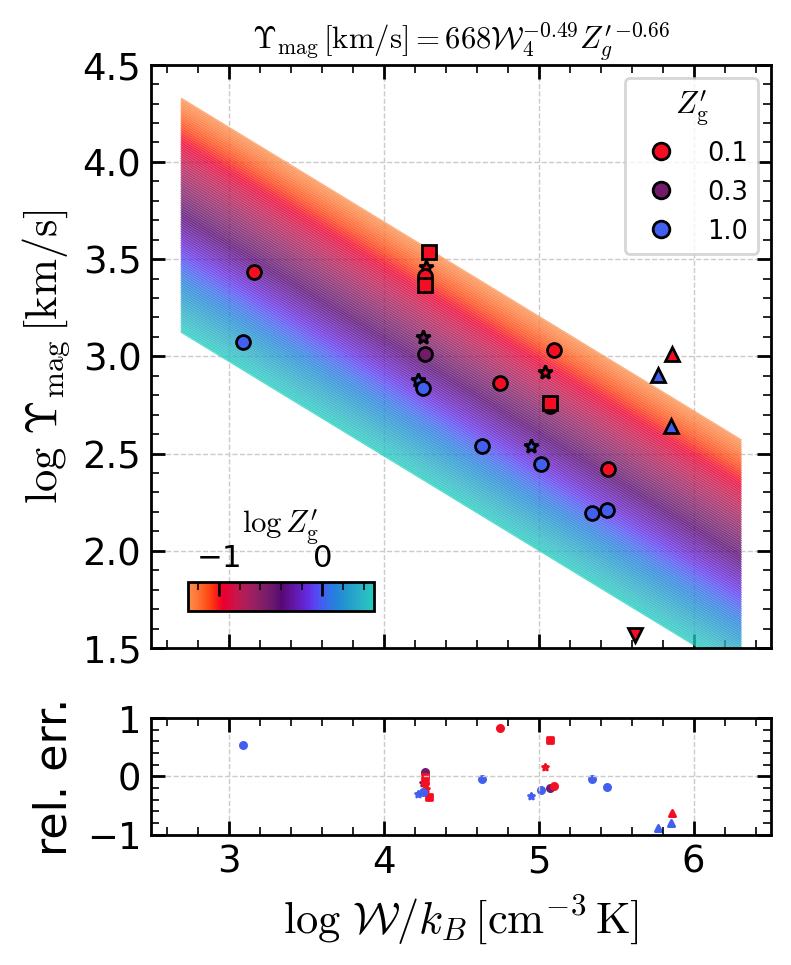

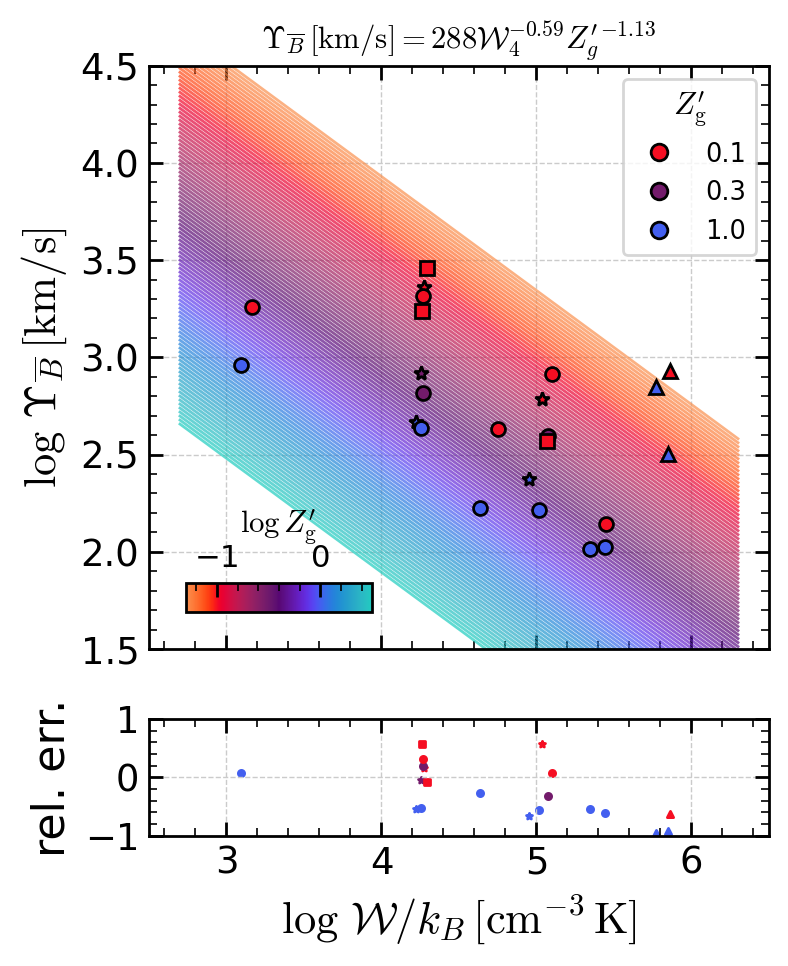

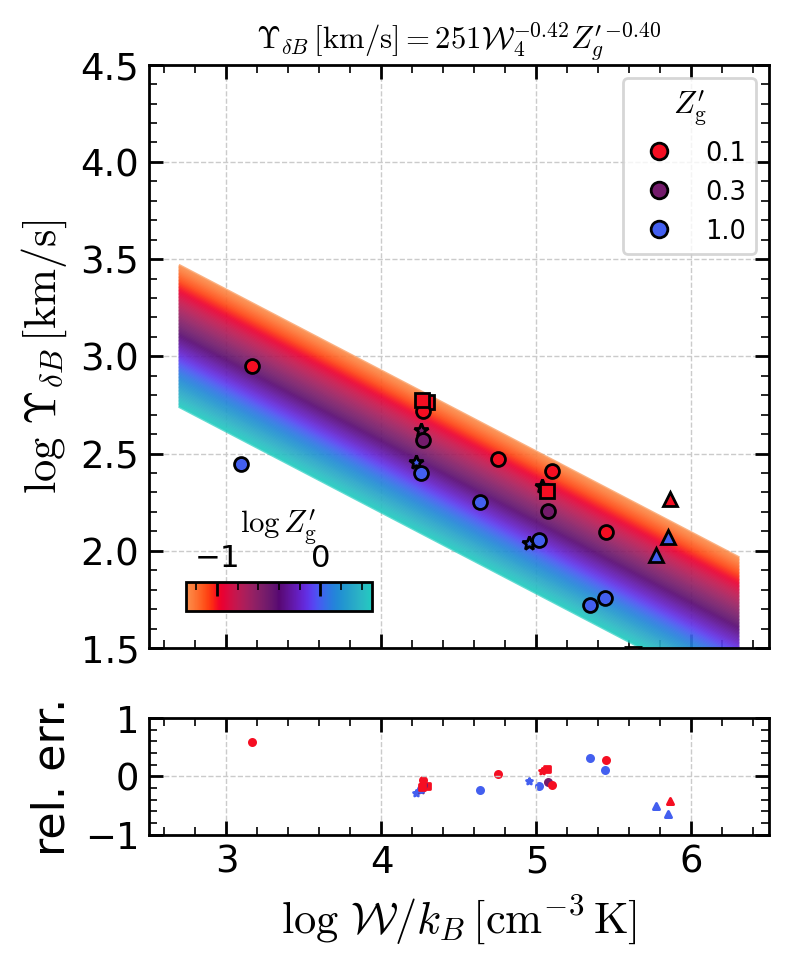

In [ ]:
# Figure for feedback yields (each component saved into each figure)

for yf in ["Ytot", "Yth", "Yturb", "Ynonth", "Ymag", "oYmag", "dYmag"]:
    fig, axes = plt.subplots(
        2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
    )

    # set field names for x-axes and yaxis
    x1, x2 = ["W", "Zgas"]

    # linear regression
    odr_out = fit_odr(qdset, xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # plot simulation data along with fitting result
    plt.sca(axes[0])

    # write fitting result as the axis title
    a = odr_out.beta[1]
    b = odr_out.beta[2]
    Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
    tit = (
        labels[yf]
        + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
    )
    plt.title(tit, fontsize="x-small")

    # call plotting script
    if "nolegend" in outdir:
        plot_fitting_mean(qdset, model_dset, x1, yf, legend=0, colorbar=0, model=True)
    else:
        plot_fitting_mean(qdset, model_dset, x1, yf, legend=1, colorbar=3, model=True)
    # plot all data as grey dots
    # plt.plot(pt_df[x1],pt_df[yf],'.',color='grey',alpha=0.1,mew=0,zorder=-1)
    plt.ylim((1.5, 4.5))
    plt.xlabel("")

    # plot residual compared with the fitting result
    plt.sca(axes[1])
    print(yf)
    plot_fitting_mean(qdset, model_dset, x1, yf, residual=True, model=True)

    # decorate axis
    fig.axes[-1].xaxis.set_ticks_position("top")
    fig.axes[-1].xaxis.set_label_position("top")
    plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
    fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")

    # TIGRESS-classic
    if yf == "Ytot":
        plt.sca(axes[0])
        plt.plot(Wref, 3.86 - 0.212 * Wref, **ref_kwargs)
    elif yf == "Yth":
        plt.sca(axes[0])
        plt.plot(Wref, 4.45 - 0.506 * Wref, **ref_kwargs)
    elif yf == "Yturb":
        plt.sca(axes[0])
        plt.plot(Wref, 2.81 - 0.060 * Wref, **ref_kwargs)
    plt.xlim(Wref_min, Wref_max)
    # save figure
    plt.savefig(os.path.join(outdir, f"{yf}_fit.png"), bbox_inches="tight")

Beta: [ 4.77950412 -0.52648525 -0.59328964]
Beta Std Error: [0.15702443 0.03128173 0.04920877]
Beta Covariance: [[ 2.94562411 -0.57264484  0.24605037]
 [-0.57264484  0.11690266 -0.01976627]
 [ 0.24605037 -0.01976627  0.28928627]]
Residual Variance: 0.008370610588845582
Inverse Condition #: 0.0032243212459416837
Reason(s) for Halting:
  Sum of squares convergence
Beta: [ 4.36630627 -0.28656393 -0.24131985]
Beta Std Error: [0.24335454 0.04848587 0.07617964]
Beta Covariance: [[ 2.06331325 -0.4011822   0.171828  ]
 [-0.4011822   0.08190619 -0.01378513]
 [ 0.171828   -0.01378513  0.20219208]]
Residual Variance: 0.028702104406640387
Inverse Condition #: 0.0032237392834300596
Reason(s) for Halting:
  Sum of squares convergence


L1 : 0.30033734318636846
L2 : 0.39707007341344336


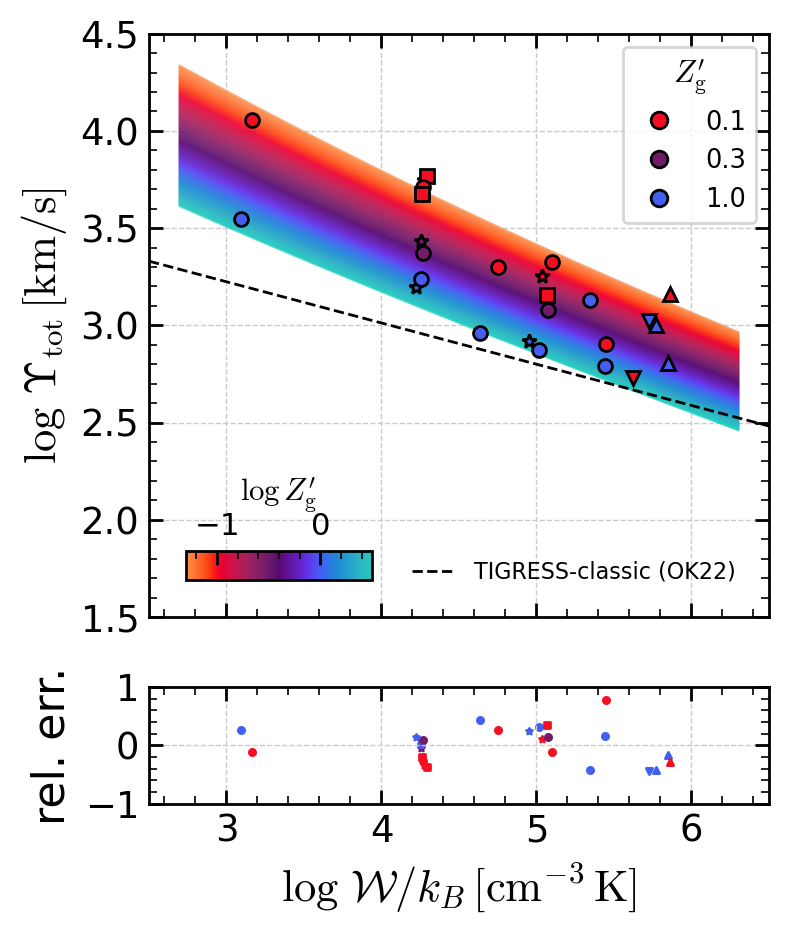

In [ ]:
# Figure for total feedback yield compared with
# the model based on thermal + nonthermal (turbulent+magnetic)
fig, axes = plt.subplots(
    2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
)

x1, x2 = ["W", "Zgas"]

# fitting for thermal feedback yield
yf = "Yth"
odr_out = fit_odr(qdset, xf1=x1, xf2=x2, yf=yf)
# construct model (not the x1-axis is not W and the parameter range is changed)
model_dset1 = get_model_odr(
    odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
)

# fitting for non-thermal feedback yield
yf = "Ynonth"
odr_out = fit_odr(qdset, xf1=x1, xf2=x2, yf=yf)
# construct model (not the x1-axis is not W and the parameter range is changed)
model_dset2 = get_model_odr(
    odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
)

# get total feedback yield model by summing up two
model_dset = np.log10(10**model_dset1 + 10**model_dset2)

# plot results
plt.sca(axes[0])
plot_fitting_mean(qdset, model_dset, x1, "Ytot", legend=1, colorbar=3)
# plt.plot(pt_df[x1],pt_df['Ytot'],'.',color='grey',alpha=0.1,mew=0,zorder=-1)
# plt.ylim((5.e1,2.e4))
plt.ylim(1.5, 4.5)

plt.sca(axes[1])
plot_fitting_mean(qdset, model_dset, x1, "Ytot", residual=True)

axes[0].set_xlabel("")
fig.axes[-1].xaxis.set_ticks_position("top")
fig.axes[-1].xaxis.set_label_position("top")
plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")


# add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
plt.sca(axes[0])
plt.plot(Wref, 3.86 - 0.212 * Wref, **ref_kwargs)
leg1 = plt.gca().get_legend()
custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
leg2 = plt.legend(
    custom_lines2,
    ["TIGRESS-classic (OK22)"],
    loc=4,
    borderpad=1,
    fontsize=8,
    frameon=False,
)
plt.gca().add_artist(leg1)
plt.xlim(Wref_min, Wref_max)

plt.savefig(os.path.join(outdir, "Ytot_fit2.png"), bbox_inches="tight")

In [ ]:
yield_conv = (
    ((au.cm ** (-3) * au.K * ac.k_B) / (ac.M_sun / ac.kpc**2 / au.yr)).to("km/s").value
)

In [ ]:
qdset_ = qdset.to_dataset("variable")
for yf in ["Ytot", "Yth", "Yturb", "Ymag", "oYmag", "dYmag"]:
    qdset_[yf] = (
        qdset_[yf.replace("Y", "Pi" if "mag" in yf else "P")]
        / qdset_["sfr"]
        * yield_conv
    )
qdset_["Ynonth"] = (qdset_["Pturb"] + qdset_["Pimag"]) / qdset_["sfr"] * yield_conv

Beta: [ 4.39421371 -0.28877526 -0.24014634]
Beta Std Error: [0.17855664 0.03556592 0.05584599]
Beta Covariance: [[ 2.06337681 -0.40109516  0.17269869]
 [-0.40109516  0.08186431 -0.01400413]
 [ 0.17269869 -0.01400413  0.20184154]]
Residual Variance: 0.01545160097477207
Inverse Condition #: 0.0032230031777006262
Reason(s) for Halting:
  Sum of squares convergence
Ytot
L1 : 0.23088351621640843
L2 : 0.3540017765401516
Beta: [ 4.47050301 -0.46344014 -0.49865176]
Beta Std Error: [0.11942223 0.02378568 0.03736839]
Beta Covariance: [[ 2.64531614 -0.51417644  0.22174413]
 [-0.51417644  0.10493936 -0.01799868]
 [ 0.22174413 -0.01799868  0.25900964]]
Residual Variance: 0.005391290936560247
Inverse Condition #: 0.0032232420117713797
Reason(s) for Halting:
  Sum of squares convergence
Yth
L1 : 0.14657305970028836
L2 : 0.22409035608965341
Beta: [ 3.65524674 -0.21658762  0.00410215]
Beta Std Error: [0.21581868 0.04297583 0.06737663]
Beta Covariance: [[ 1.8950984  -0.3683052   0.15941989]
 [-0.3683052

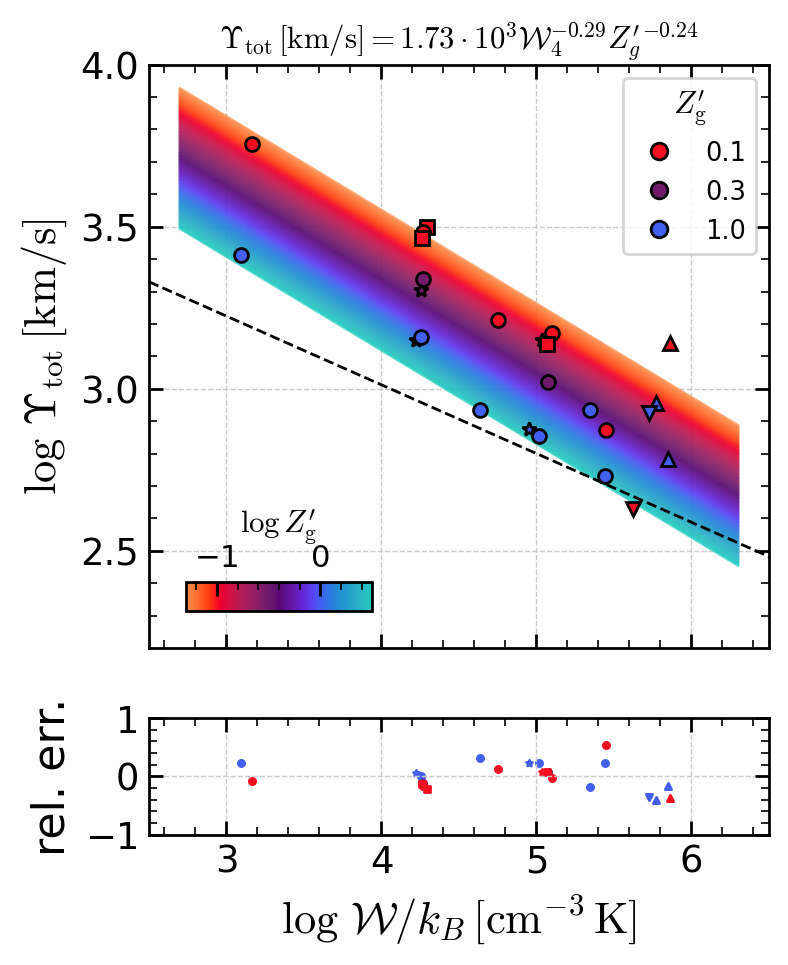

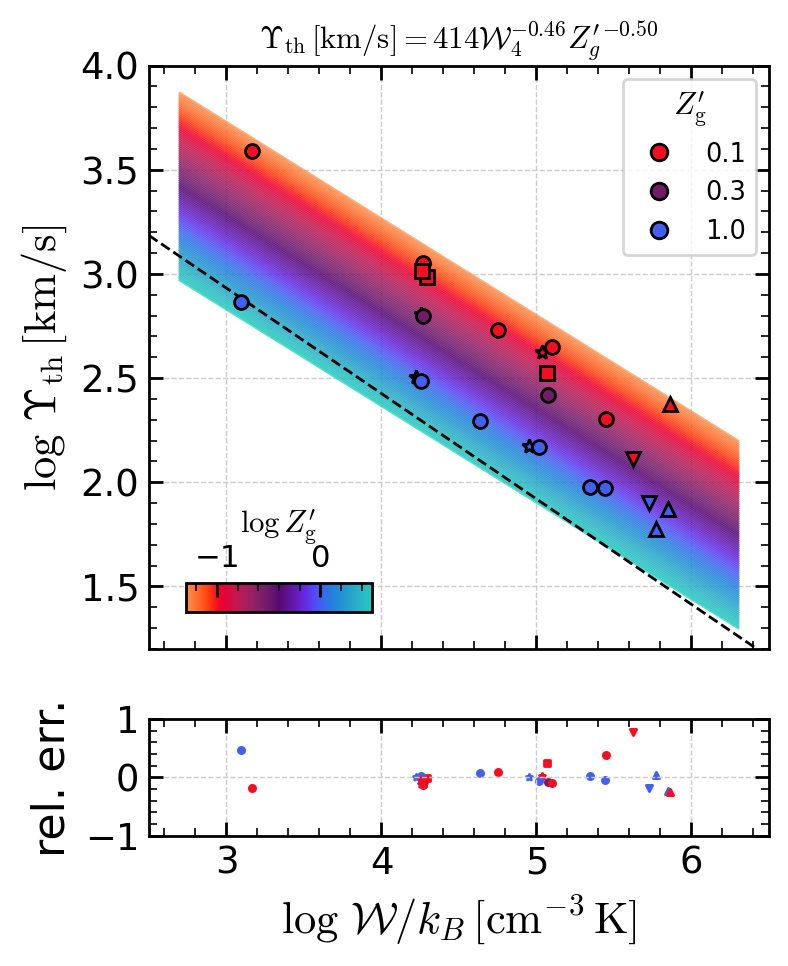

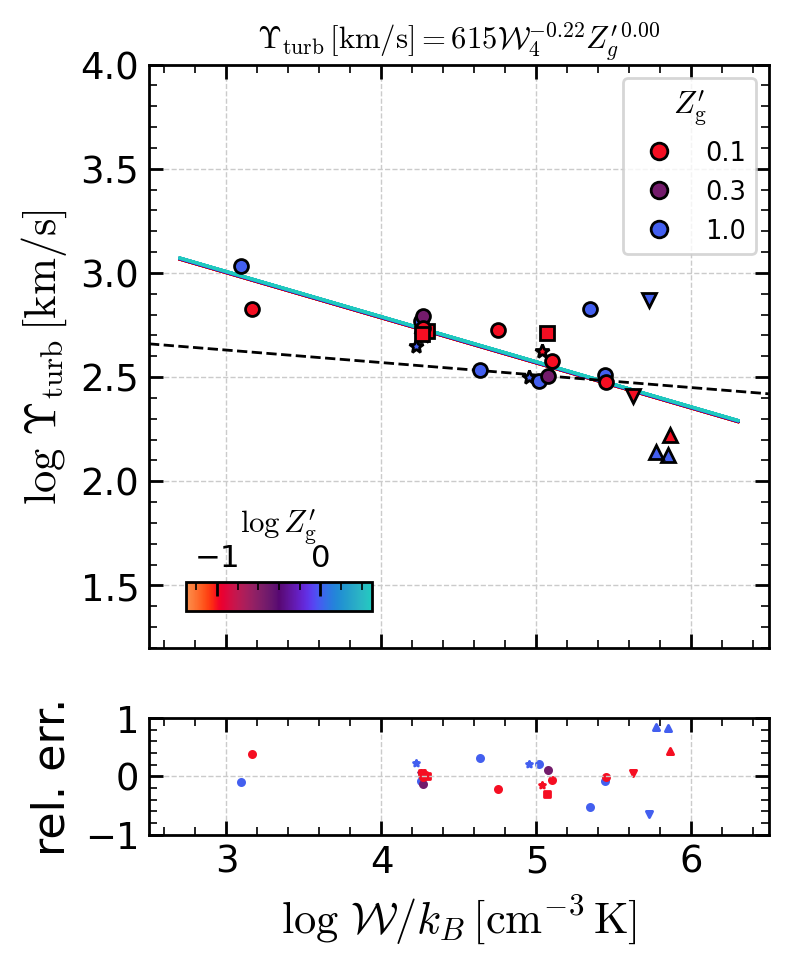

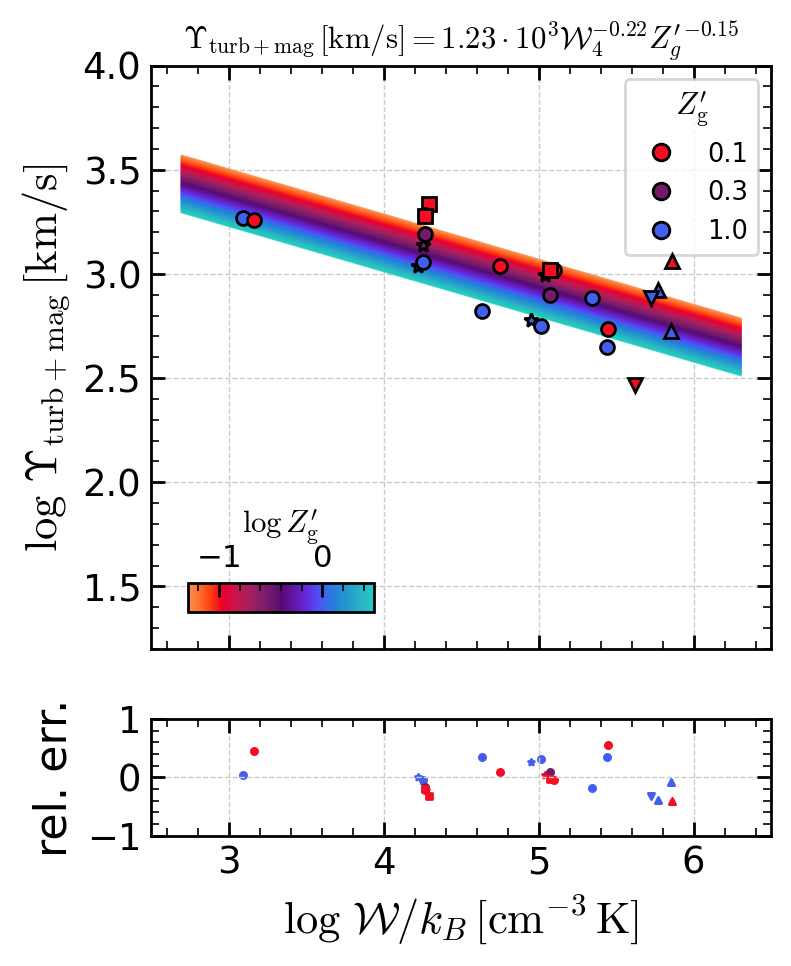

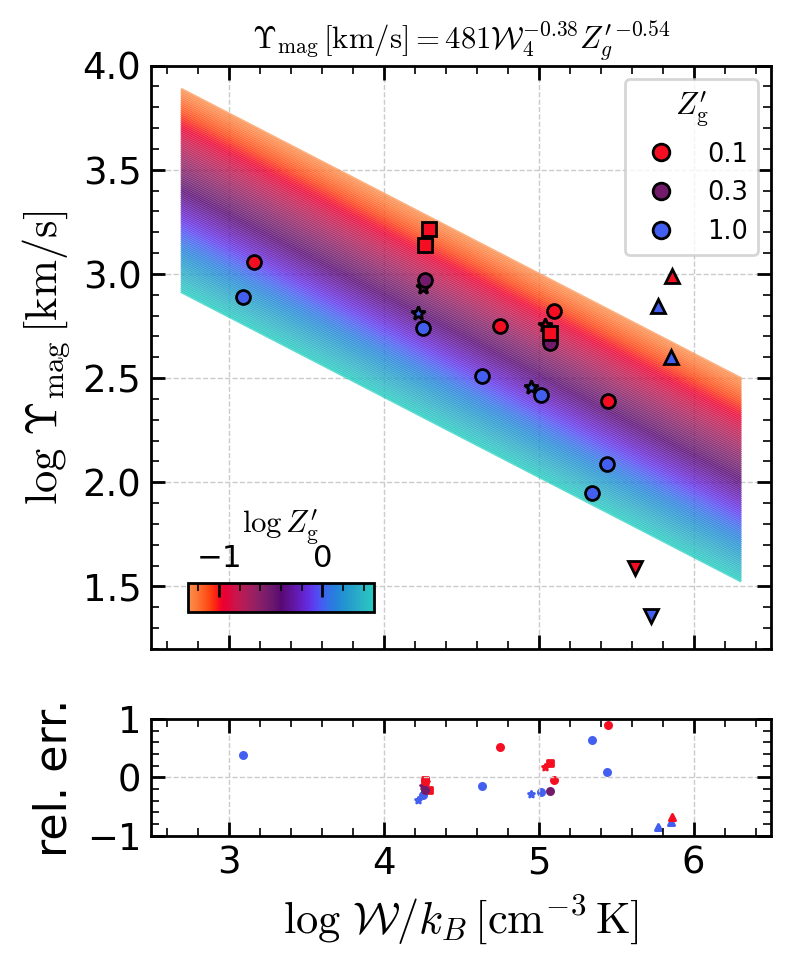

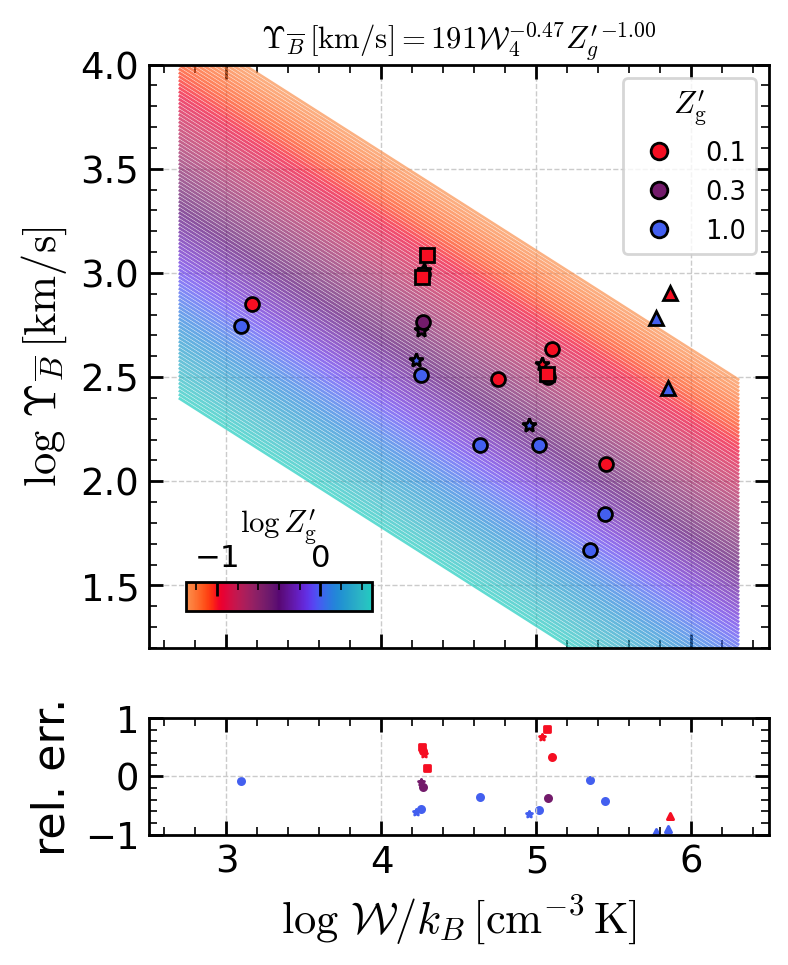

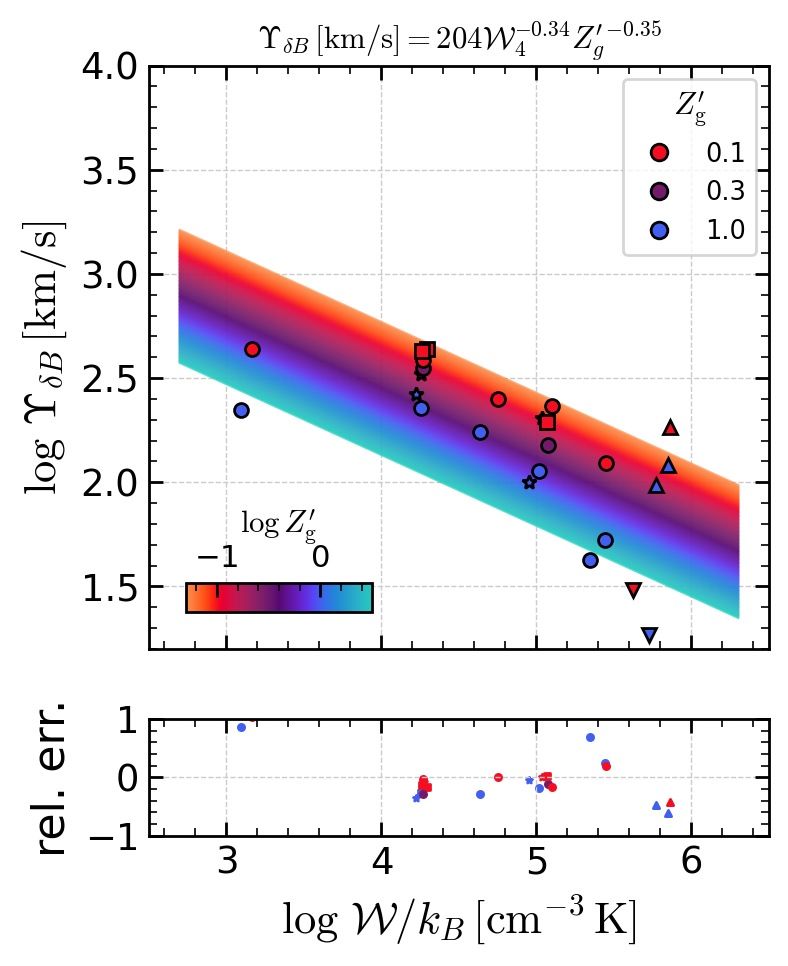

In [ ]:
with plt.style.context({"savefig.bbox": "tight"}):
    # Figure for feedback yields (each component saved into each figure)
    for yf in ["Ytot", "Yth", "Yturb", "Ynonth", "Ymag", "oYmag", "dYmag"]:
        fig, axes = plt.subplots(
            2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
        )

        # set field names for x-axes and yaxis
        x1, x2 = ["W", "Zgas"]

        # linear regression
        odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
        # construct model (not the x1-axis is not W and the parameter range is changed)
        model_dset = get_model_odr(
            odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
        )

        # plot simulation data along with fitting result
        plt.sca(axes[0])

        # write fitting result as the axis title
        a = odr_out.beta[1]
        b = odr_out.beta[2]
        Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
        tit = (
            labels[yf]
            + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
        )
        plt.title(tit, fontsize="x-small")

        # call plotting script
        plot_fitting_mean(
            qdset_.to_array(), model_dset, x1, yf, legend=1, colorbar=3, model=True
        )
        # plot all data as grey dots
        # plt.plot(pt_df[x1],pt_df[yf],'.',color='grey',alpha=0.1,mew=0,zorder=-1)
        plt.ylim((1.2, 4.0))
        if yf == "Ytot":
            plt.ylim((2.2, 4.0))
        plt.xlabel("")

        # plot residual compared with the fitting result
        plt.sca(axes[1])
        print(yf)
        plot_fitting_mean(
            qdset_.to_array(), model_dset, x1, yf, residual=True, model=True
        )

        # decorate axis
        fig.axes[-1].xaxis.set_ticks_position("top")
        fig.axes[-1].xaxis.set_label_position("top")
        plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
        fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")

        # TIGRESS-classic
        if yf == "Ytot":
            plt.sca(axes[0])
            plt.plot(Wref, 3.86 - 0.212 * Wref, **ref_kwargs)
        elif yf == "Yth":
            plt.sca(axes[0])
            plt.plot(Wref, 4.45 - 0.506 * Wref, **ref_kwargs)
        elif yf == "Yturb":
            plt.sca(axes[0])
            plt.plot(Wref, 2.81 - 0.060 * Wref, **ref_kwargs)
        plt.xlim(Wref_min, Wref_max)
        # save figure
        plt.savefig(os.path.join(outdir, f"{yf}_mean_fit.png"), bbox_inches=None)

Beta: [ 4.39421371 -0.28877526 -0.24014634]
Beta Std Error: [0.17855664 0.03556592 0.05584599]
Beta Covariance: [[ 2.06337681 -0.40109516  0.17269869]
 [-0.40109516  0.08186431 -0.01400413]
 [ 0.17269869 -0.01400413  0.20184154]]
Residual Variance: 0.01545160097477207
Inverse Condition #: 0.0032230031777006262
Reason(s) for Halting:
  Sum of squares convergence
Ytot
L1 : 0.23088351621640843
L2 : 0.3540017765401516
Beta: [ 4.47050301 -0.46344014 -0.49865176]
Beta Std Error: [0.11942223 0.02378568 0.03736839]
Beta Covariance: [[ 2.64531614 -0.51417644  0.22174413]
 [-0.51417644  0.10493936 -0.01799868]
 [ 0.22174413 -0.01799868  0.25900964]]
Residual Variance: 0.005391290936560247
Inverse Condition #: 0.0032232420117713797
Reason(s) for Halting:
  Sum of squares convergence
Yth
L1 : 0.14657305970028836
L2 : 0.22409035608965341
Beta: [ 3.65524674 -0.21658762  0.00410215]
Beta Std Error: [0.21581868 0.04297583 0.06737663]
Beta Covariance: [[ 1.8950984  -0.3683052   0.15941989]
 [-0.3683052

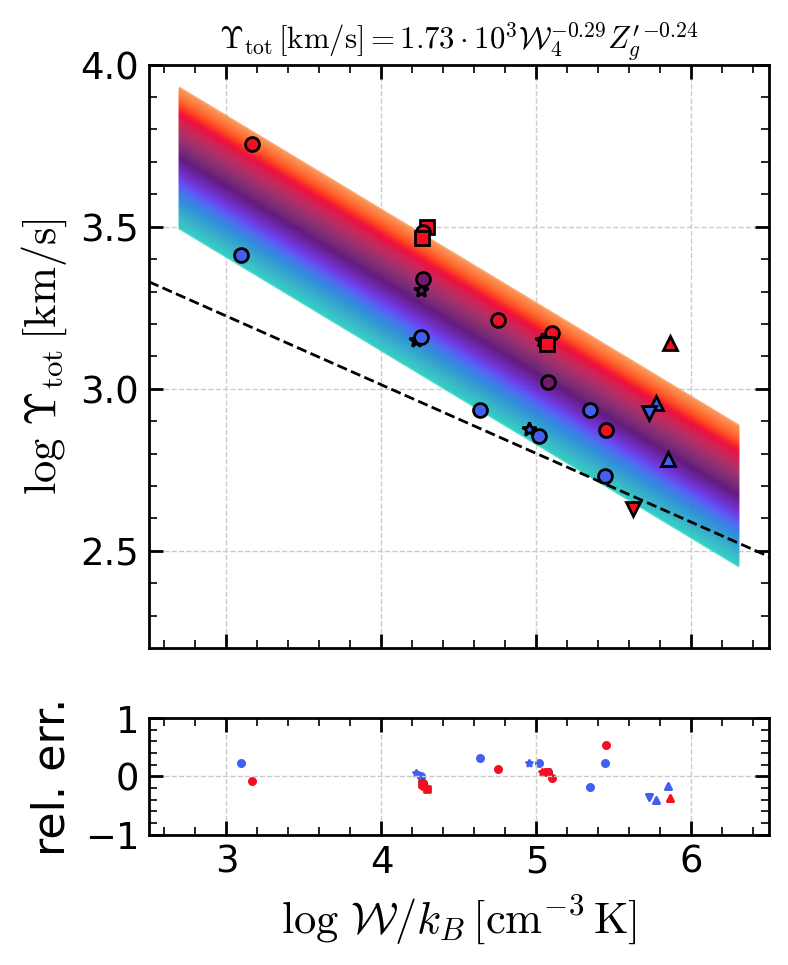

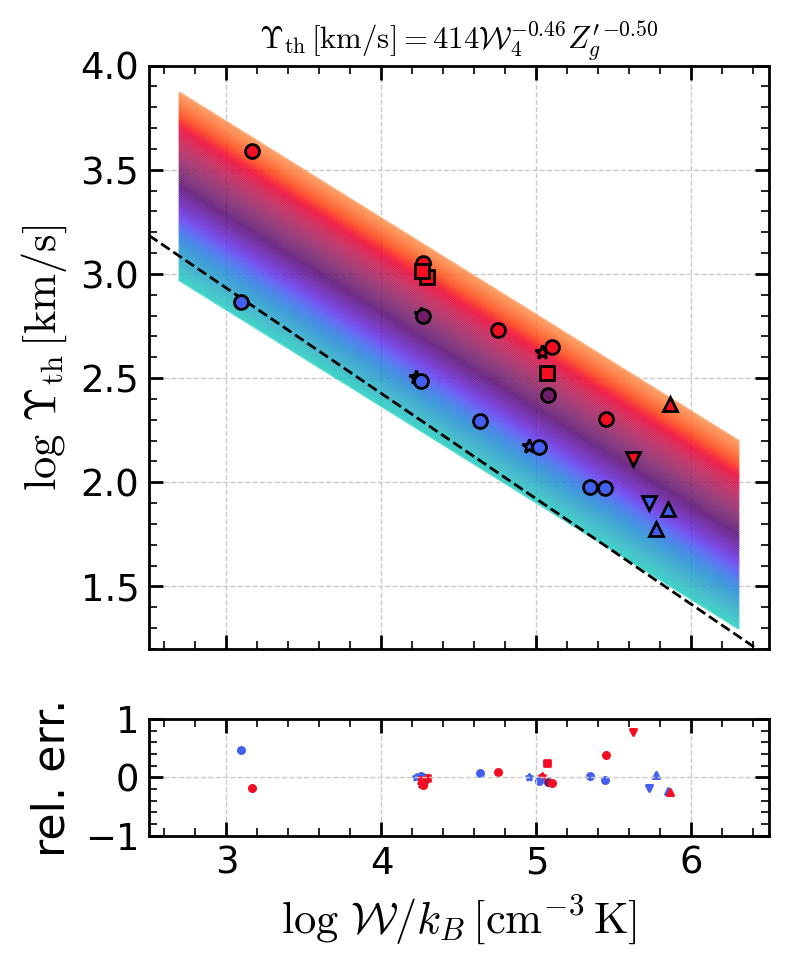

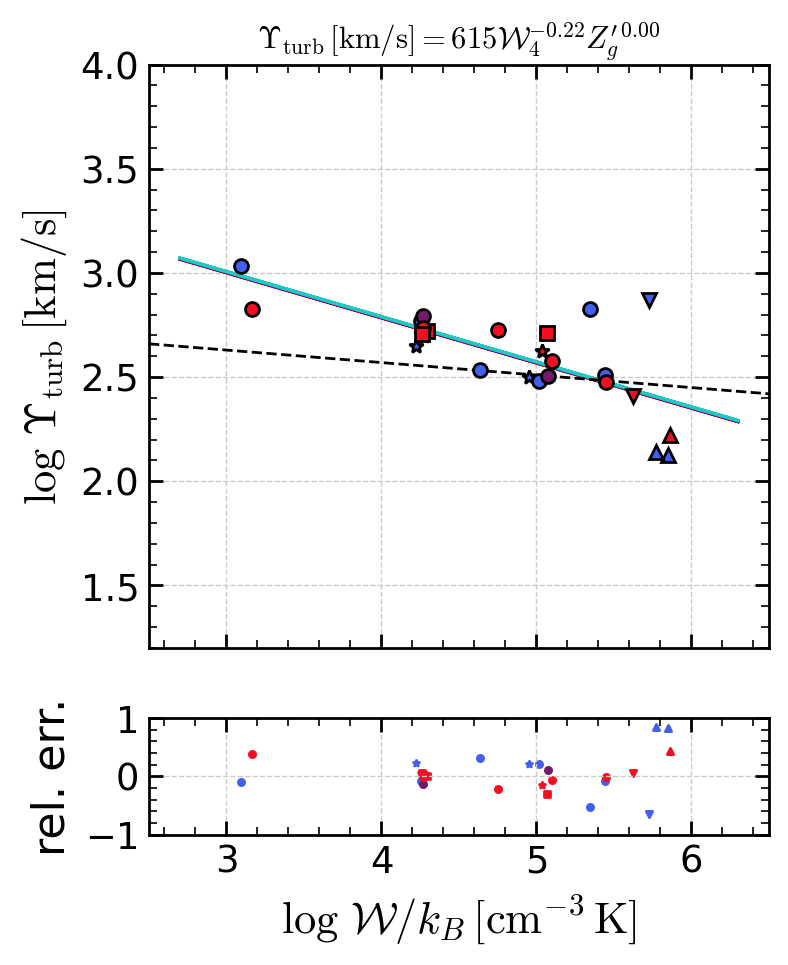

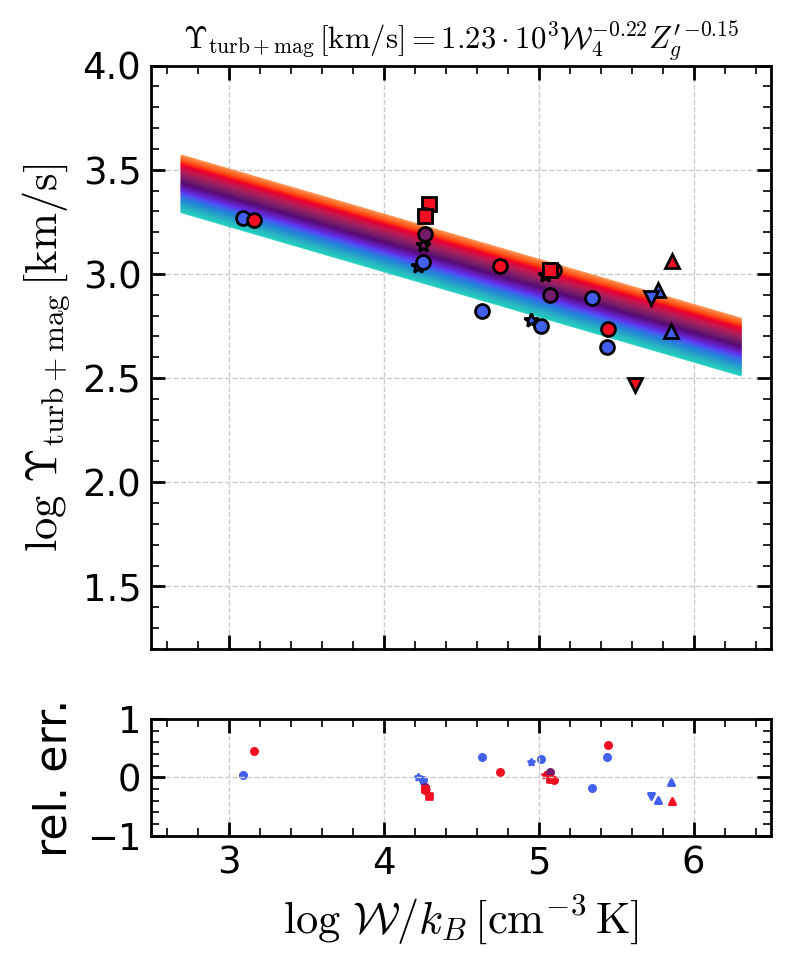

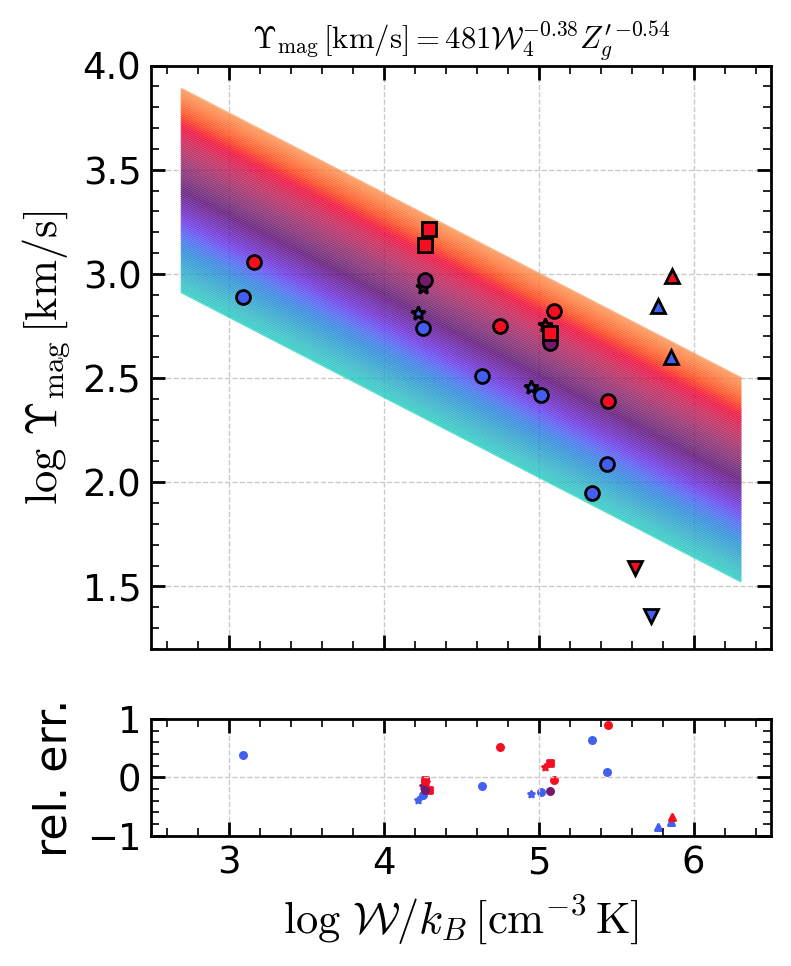

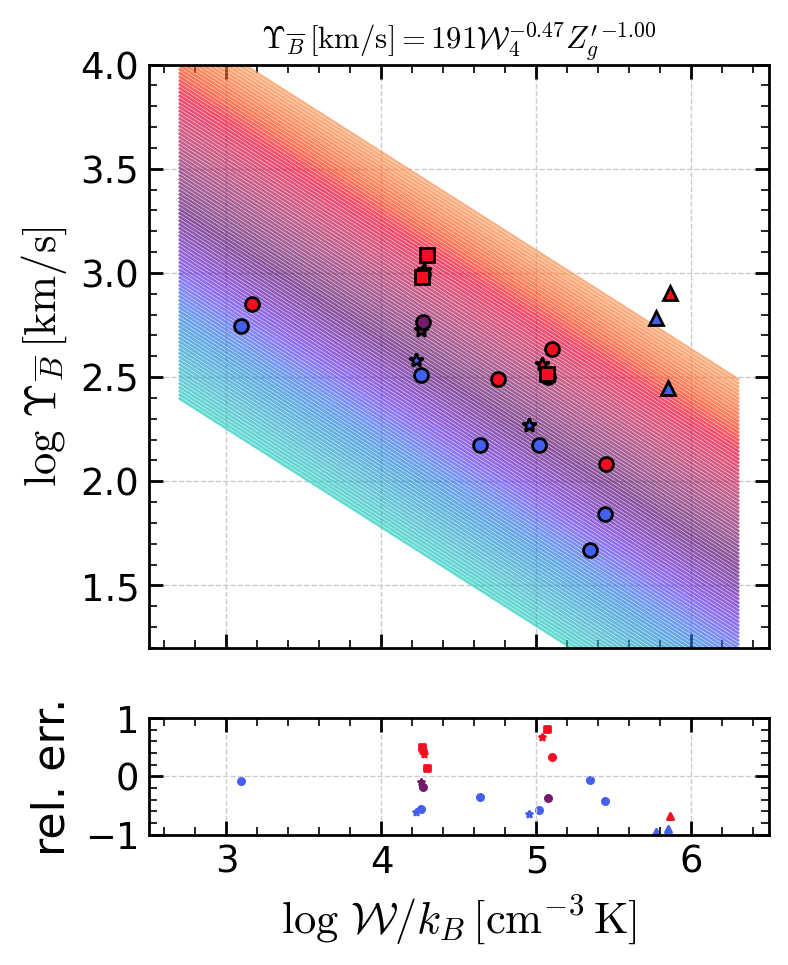

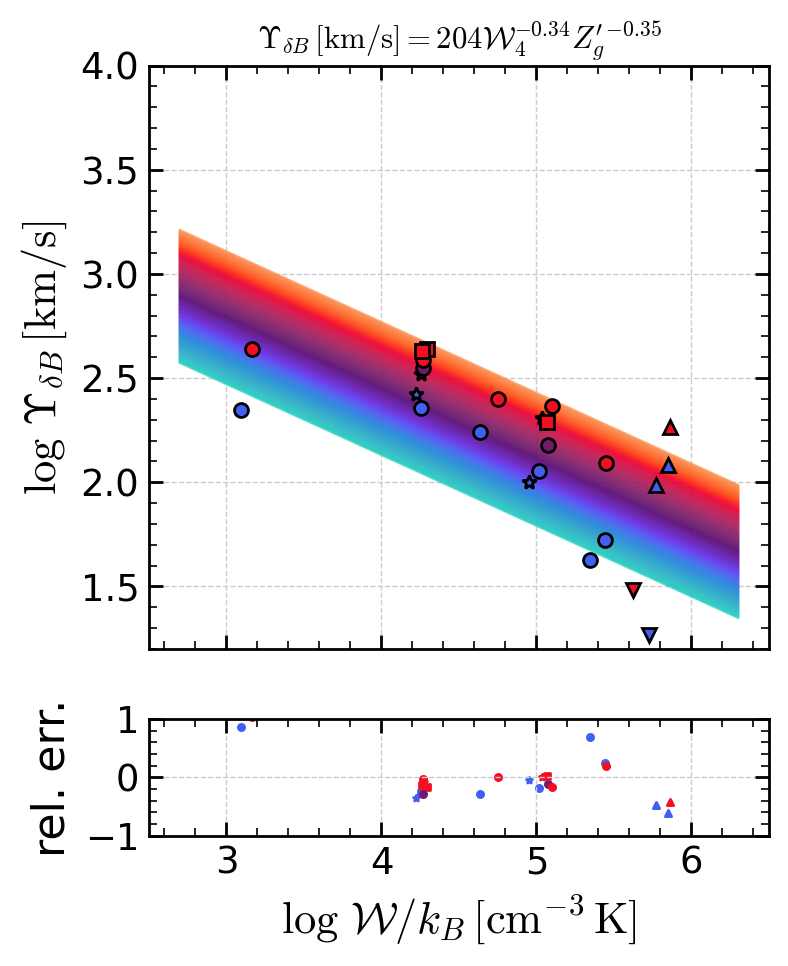

In [ ]:
with plt.style.context({"savefig.bbox": "tight"}):
    # Figure for feedback yields (each component saved into each figure)
    for yf in ["Ytot", "Yth", "Yturb", "Ynonth", "Ymag", "oYmag", "dYmag"]:
        fig, axes = plt.subplots(
            2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
        )

        # set field names for x-axes and yaxis
        x1, x2 = ["W", "Zgas"]

        # linear regression
        odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
        # construct model (not the x1-axis is not W and the parameter range is changed)
        model_dset = get_model_odr(
            odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
        )

        # plot simulation data along with fitting result
        plt.sca(axes[0])

        # write fitting result as the axis title
        a = odr_out.beta[1]
        b = odr_out.beta[2]
        Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
        tit = (
            labels[yf]
            + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
        )
        plt.title(tit, fontsize="x-small")

        # call plotting script
        plot_fitting_mean(
            qdset_.to_array(), model_dset, x1, yf, legend=0, colorbar=0, model=True
        )
        plt.ylim((1.2, 4.0))
        if yf == "Ytot":
            plt.ylim((2.2, 4.0))
        plt.xlabel("")

        # plot residual compared with the fitting result
        plt.sca(axes[1])
        print(yf)
        plot_fitting_mean(
            qdset_.to_array(), model_dset, x1, yf, residual=True, model=True
        )

        # TIGRESS-classic
        if yf == "Ytot":
            plt.sca(axes[0])
            plt.plot(Wref, 3.86 - 0.212 * Wref, **ref_kwargs)
        elif yf == "Yth":
            plt.sca(axes[0])
            plt.plot(Wref, 4.45 - 0.506 * Wref, **ref_kwargs)
        elif yf == "Yturb":
            plt.sca(axes[0])
            plt.plot(Wref, 2.81 - 0.060 * Wref, **ref_kwargs)
        plt.xlim(Wref_min, Wref_max)
        # save figure
        plt.savefig(
            os.path.join(outdir, f"{yf}_mean_fit_nolegend.png"), bbox_inches=None
        )

Beta: [ 4.22065512 -0.38452482 -0.54048042]
Beta Std Error: [0.51632452 0.10322561 0.16770583]
Beta Covariance: [[ 2.60923589 -0.50849717  0.20668025]
 [-0.50849717  0.10429002 -0.01310187]
 [ 0.20668025 -0.01310187  0.27527335]]
Residual Variance: 0.1021720612452935
Inverse Condition #: 0.0032448492740230054
Reason(s) for Halting:
  Sum of squares convergence
Ymag
L1 : 0.8651192301554941
L2 : 2.0183203009907915


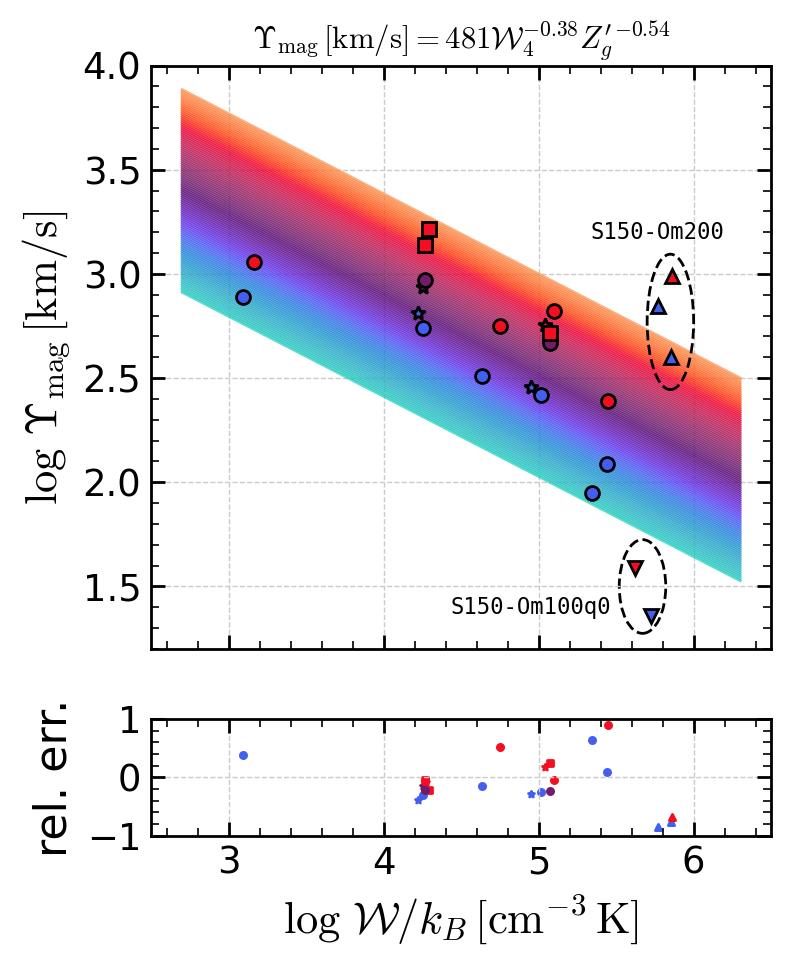

In [ ]:
with plt.style.context({"savefig.bbox": "tight"}):
    # Figure for feedback yields (each component saved into each figure)
    yf = "Ymag"
    fig, axes = plt.subplots(
        2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
    )

    # set field names for x-axes and yaxis
    x1, x2 = ["W", "Zgas"]

    # linear regression
    odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # plot simulation data along with fitting result
    plt.sca(axes[0])

    # write fitting result as the axis title
    a = odr_out.beta[1]
    b = odr_out.beta[2]
    Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
    tit = (
        labels[yf]
        + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
    )
    plt.title(tit, fontsize="x-small")

    # call plotting script
    plot_fitting_mean(
        qdset_.to_array(), model_dset, x1, yf, legend=0, colorbar=0, model=True
    )
    plt.ylim((1.2, 4.0))
    if yf == "Ytot":
        plt.ylim((2.2, 4.0))
    plt.xlabel("")

    # two labels
    el = Ellipse((5.67, 1.5), 0.3, 0.45, ls="--", fc="none", color="k", lw=1)
    axes[0].add_artist(el)
    plt.annotate(
        "S150-Om100q0",
        (5.47, 1.4),
        family="monospace",
        fontsize=8,
        ha="right",
        va="center",
    )

    el = Ellipse(
        (5.85, 2.77), 0.3, 0.65, ls="--", fc="none", color="k", lw=1, zorder=20
    )
    axes[0].add_artist(el)
    plt.annotate(
        "S150-Om200",
        (6.2, 3.2),
        family="monospace",
        fontsize=8,
        ha="right",
        va="center",
    )
    # plot residual compared with the fitting result
    plt.sca(axes[1])
    print(yf)
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, yf, residual=True, model=True)

    # TIGRESS-classic
    if yf == "Ytot":
        plt.sca(axes[0])
        plt.plot(Wref, 3.86 - 0.212 * Wref, **ref_kwargs)
    elif yf == "Yth":
        plt.sca(axes[0])
        plt.plot(Wref, 4.45 - 0.506 * Wref, **ref_kwargs)
    elif yf == "Yturb":
        plt.sca(axes[0])
        plt.plot(Wref, 2.81 - 0.060 * Wref, **ref_kwargs)
    plt.xlim(Wref_min, Wref_max)
    # save figure
    plt.savefig(os.path.join(outdir, f"{yf}_mean_fit_nolegend.png"), bbox_inches=None)

Beta: [ 3.65524674 -0.21658762  0.00410215]
Beta Std Error: [0.21581868 0.04297583 0.06737663]
Beta Covariance: [[ 1.8950984  -0.3683052   0.15941989]
 [-0.3683052   0.07514538 -0.01310309]
 [ 0.15941989 -0.01310309  0.18470227]]
Residual Variance: 0.02457798616846529
Inverse Condition #: 0.003219432822190876
Reason(s) for Halting:
  Sum of squares convergence
Yturb
L1 : 0.23622117347116572
L2 : 0.3345512200848866


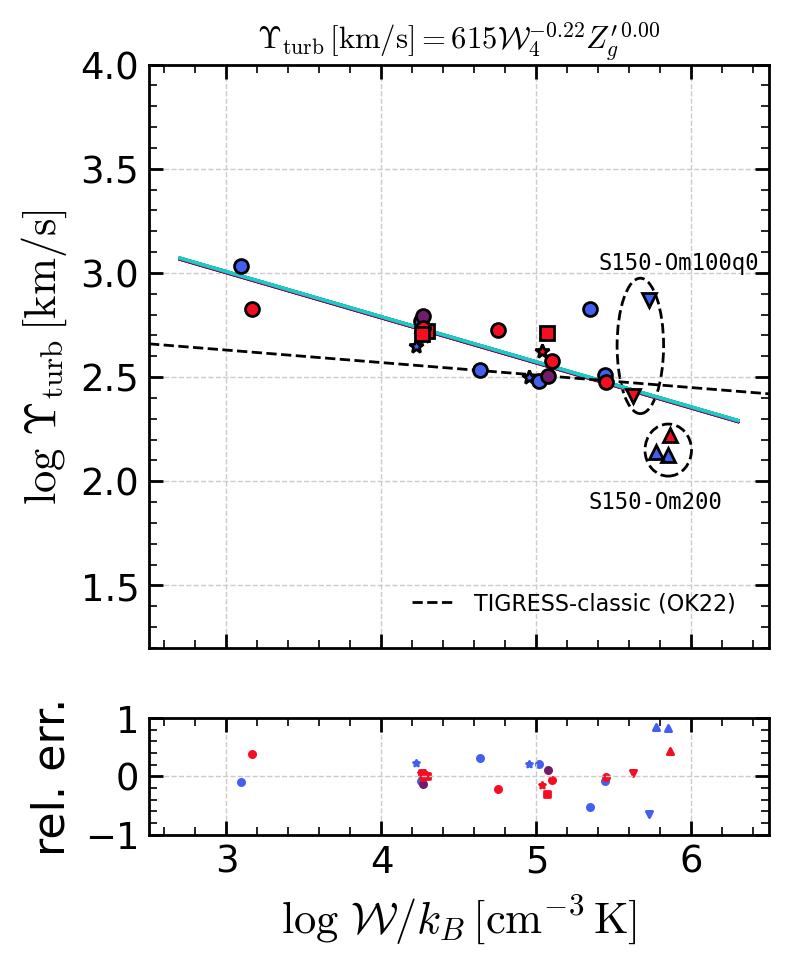

In [ ]:
with plt.style.context({"savefig.bbox": "tight"}):
    # Figure for feedback yields (each component saved into each figure)
    yf = "Yturb"
    fig, axes = plt.subplots(
        2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
    )

    # set field names for x-axes and yaxis
    x1, x2 = ["W", "Zgas"]

    # linear regression
    odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # plot simulation data along with fitting result
    plt.sca(axes[0])

    # write fitting result as the axis title
    a = odr_out.beta[1]
    b = odr_out.beta[2]
    Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
    tit = (
        labels[yf]
        + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
    )
    plt.title(tit, fontsize="x-small")

    # call plotting script
    plot_fitting_mean(
        qdset_.to_array(), model_dset, x1, yf, legend=0, colorbar=0, model=True
    )
    plt.ylim((1.2, 4.0))
    if yf == "Ytot":
        plt.ylim((2.2, 4.0))
    plt.xlabel("")

    # two labels
    el = Ellipse((5.67, 2.65), 0.3, 0.65, ls="--", fc="none", color="k", lw=1)
    axes[0].add_artist(el)
    plt.annotate(
        "S150-Om100q0",
        (5.4, 3.05),
        family="monospace",
        fontsize=8,
        ha="left",
        va="center",
    )

    el = Ellipse(
        (5.85, 2.15), 0.3, 0.25, ls="--", fc="none", color="k", lw=1, zorder=20
    )
    axes[0].add_artist(el)
    plt.annotate(
        "S150-Om200",
        (6.2, 1.9),
        family="monospace",
        fontsize=8,
        ha="right",
        va="center",
    )
    # plot residual compared with the fitting result
    plt.sca(axes[1])
    print(yf)
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, yf, residual=True, model=True)

    # TIGRESS-classic
    if yf == "Ytot":
        plt.sca(axes[0])
        plt.plot(Wref, 3.86 - 0.212 * Wref, **ref_kwargs)
    elif yf == "Yth":
        plt.sca(axes[0])
        plt.plot(Wref, 4.45 - 0.506 * Wref, **ref_kwargs)
    elif yf == "Yturb":
        plt.sca(axes[0])
        plt.plot(Wref, 2.81 - 0.060 * Wref, **ref_kwargs)
    plt.xlim(Wref_min, Wref_max)
    custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
    leg2 = plt.legend(
        custom_lines2,
        ["TIGRESS-classic (OK22)"],
        loc=4,
        borderpad=1,
        fontsize=8,
        frameon=False,
    )
    # save figure
    plt.savefig(os.path.join(outdir, f"{yf}_mean_fit_nolegend.png"), bbox_inches=None)

Beta: [ 4.47050301 -0.46344014 -0.49865176]
Beta Std Error: [0.11942223 0.02378568 0.03736839]
Beta Covariance: [[ 2.64531614 -0.51417644  0.22174413]
 [-0.51417644  0.10493936 -0.01799868]
 [ 0.22174413 -0.01799868  0.25900964]]
Residual Variance: 0.005391290936560247
Inverse Condition #: 0.0032232420117713797
Reason(s) for Halting:
  Sum of squares convergence
Beta: [ 3.95746183 -0.21690858 -0.14962089]
Beta Std Error: [0.19772865 0.0393811  0.06180416]
Beta Covariance: [[ 1.93375651 -0.37587129  0.16210213]
 [-0.37587129  0.07670759 -0.01320233]
 [ 0.16210213 -0.01320233  0.18892877]]
Residual Variance: 0.020217963041295153
Inverse Condition #: 0.00322246259716918
Reason(s) for Halting:
  Sum of squares convergence


L1 : 0.21583589627273253
L2 : 0.3379274559719123


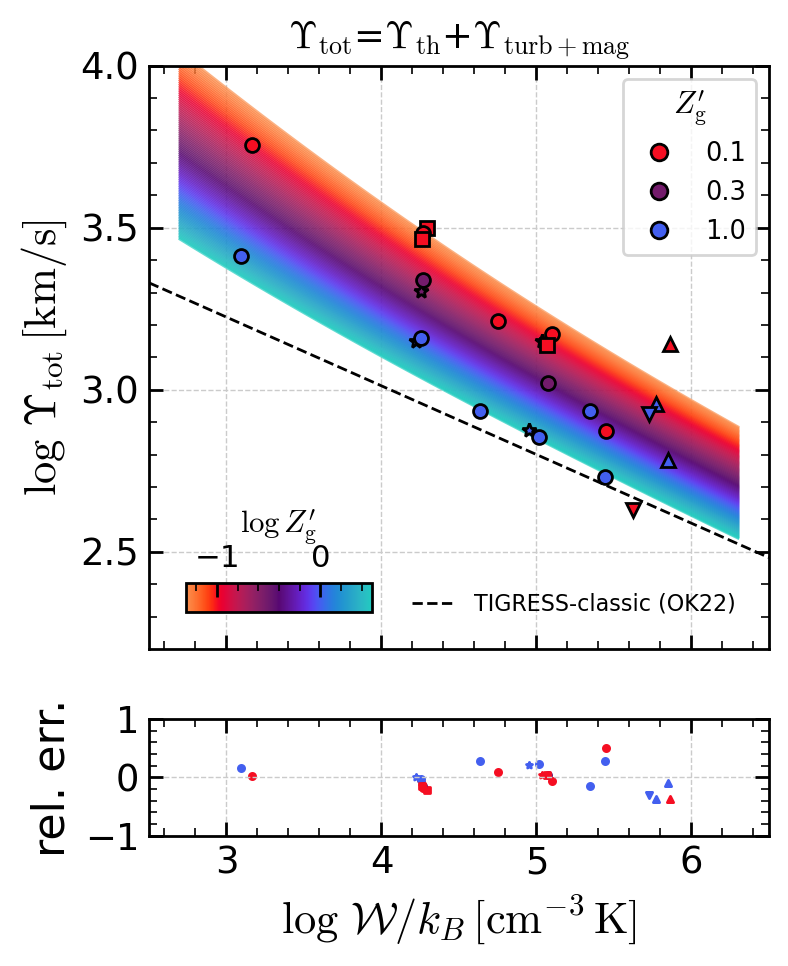

In [ ]:
with plt.style.context({"savefig.bbox": "tight"}):
    # Figure for total feedback yield compared with
    # the model based on thermal + nonthermal (turbulent+magnetic)
    fig, axes = plt.subplots(
        2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
    )

    x1, x2 = ["W", "Zgas"]

    # fitting for thermal feedback yield
    yf = "Yth"
    odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset1 = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # fitting for non-thermal feedback yield
    yf = "Ynonth"
    odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset2 = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # get total feedback yield model by summing up two
    model_dset = np.log10(10**model_dset1 + 10**model_dset2)

    # plot results
    plt.sca(axes[0])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, "Ytot", legend=1, colorbar=3)
    # plt.plot(pt_df[x1],pt_df['Ytot'],'.',color='grey',alpha=0.1,mew=0,zorder=-1)
    # plt.ylim((5.e1,2.e4))
    plt.ylim(2.2, 4.0)
    tit = (
        labels["Ytot"][:-16] + "=" + labels["Yth"][:-16] + "+" + labels["Ynonth"][:-16]
    )
    plt.title(tit, fontsize="small")

    plt.sca(axes[1])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, "Ytot", residual=True)

    axes[0].set_xlabel("")
    fig.axes[-1].xaxis.set_ticks_position("top")
    fig.axes[-1].xaxis.set_label_position("top")
    plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
    fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")

    # add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
    plt.sca(axes[0])
    plt.plot(Wref, 3.86 - 0.212 * Wref, **ref_kwargs)
    plt.xlim(Wref_min, Wref_max)
    leg1 = plt.gca().get_legend()
    custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
    leg2 = plt.legend(
        custom_lines2,
        ["TIGRESS-classic (OK22)"],
        loc=4,
        borderpad=1,
        fontsize=8,
        frameon=False,
    )
    plt.gca().add_artist(leg1)

    plt.savefig(os.path.join(outdir, "Ytot_mean_fit2.png"), bbox_inches=None)

Beta: [ 4.47050301 -0.46344014 -0.49865176]
Beta Std Error: [0.11942223 0.02378568 0.03736839]
Beta Covariance: [[ 2.64531614 -0.51417644  0.22174413]
 [-0.51417644  0.10493936 -0.01799868]
 [ 0.22174413 -0.01799868  0.25900964]]
Residual Variance: 0.005391290936560247
Inverse Condition #: 0.0032232420117713797
Reason(s) for Halting:
  Sum of squares convergence
Beta: [ 3.95746183 -0.21690858 -0.14962089]
Beta Std Error: [0.19772865 0.0393811  0.06180416]
Beta Covariance: [[ 1.93375651 -0.37587129  0.16210213]
 [-0.37587129  0.07670759 -0.01320233]
 [ 0.16210213 -0.01320233  0.18892877]]
Residual Variance: 0.020217963041295153
Inverse Condition #: 0.00322246259716918
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.21583589627273253
L2 : 0.3379274559719123


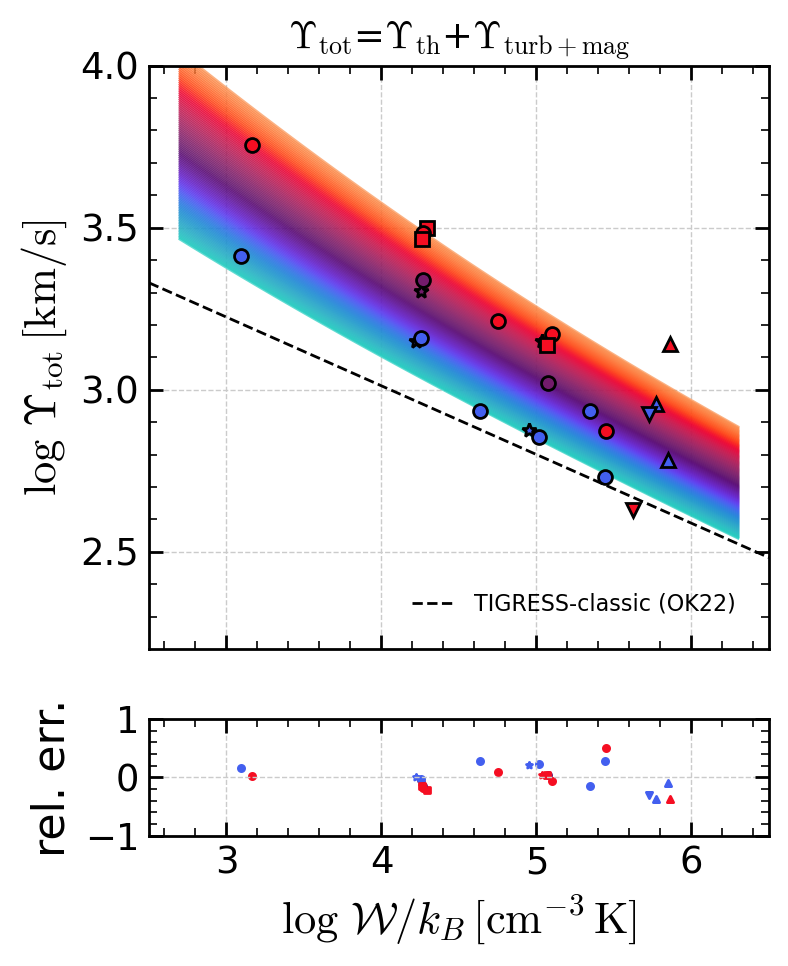

In [ ]:
with plt.style.context({"savefig.bbox": "tight"}):
    # Figure for total feedback yield compared with
    # the model based on thermal + nonthermal (turbulent+magnetic)
    fig, axes = plt.subplots(
        2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
    )

    x1, x2 = ["W", "Zgas"]

    # fitting for thermal feedback yield
    yf = "Yth"
    odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset1 = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # fitting for non-thermal feedback yield
    yf = "Ynonth"
    odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset2 = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # get total feedback yield model by summing up two
    model_dset = np.log10(10**model_dset1 + 10**model_dset2)

    # plot results
    plt.sca(axes[0])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, "Ytot", legend=0, colorbar=0)
    plt.ylim(2.2, 4.0)
    tit = (
        labels["Ytot"][:-16] + "=" + labels["Yth"][:-16] + "+" + labels["Ynonth"][:-16]
    )
    plt.title(tit, fontsize="small")

    plt.sca(axes[1])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, "Ytot", residual=True)

    axes[0].set_xlabel("")

    # add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
    plt.sca(axes[0])
    plt.plot(Wref, 3.86 - 0.212 * Wref, **ref_kwargs)
    plt.xlim(Wref_min, Wref_max)
    custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
    leg2 = plt.legend(
        custom_lines2,
        ["TIGRESS-classic (OK22)"],
        loc=4,
        borderpad=1,
        fontsize=8,
        frameon=False,
    )

    plt.savefig(os.path.join(outdir, "Ytot_mean_fit2_nolegend.png"), bbox_inches=None)